## Problem Understanding:
Membuat prediksi skor kredit, dapat memastikan pelanggan yang mampu melakukan pelunasan tidak ditolak ketika melakukan pengajuan pinjaman, dan pinjaman dapat diberikan dengan principal, maturity, dan repayment calendar yang akan memotivsi pelanggan untuk sukses.

## Goal:
Memaksimalkan fungsi Precision untuk mengurangi jumlah False Positif artinya ketika pelanggan yang mampu melakukan pelunasan tidak ditolak ketika melakukan pengajuan pinjaman.

## Objectives:
* Pilih fitur yang relevan dan memiliki hubungan kuat dengan target variabel.
* Sesuaikan threshold untuk mengklasifikasikan hasil prediksi.
* Optimasi hyperparameter model.
* Memilih algoritma machine learning yang sesuai.
* Evaluasi dan lakukan penyesuaian model.


## Metrics:
* Akurasi: Mengukur seberapa akurat model dalam memprediksi skor kredit dengan membandingkan prediksi dengan nilai sebenarnya.
* Precision: Mengukur seberapa presisi model dalam mengklasifikasikan pelanggan yang mampu melakukan pelunasan.

In [1]:
!pip install category_encoders


In [2]:
!pip install imbalanced-learn


In [3]:
import pandas as pd
import numpy as np

import matplotlib.pylab as plt  
from matplotlib_venn import venn2  
import seaborn as sns  
import matplotlib.pyplot as plt
import category_encoders as ce

from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import cohen_kappa_score

In [4]:
pip install matplotlib-venn

Note: you may need to restart the kernel to use updated packages.


# Baca Data

In [5]:
# membaca file "application_{train|test}.csv"
application_train = pd.read_csv('application_train.csv')
application_test = pd.read_csv('application_test.csv')

# membaca file "bureau.csv"
bureau = pd.read_csv('bureau.csv')

# membaca file "bureau_balance.csv"
bureau_balance = pd.read_csv('bureau_balance.csv')

# Cmembaca file "POS_CASH_balance.csv"
pos_cash_balance = pd.read_csv('POS_CASH_balance.csv')

# membaca file "credit_card_balance.csv"
credit_card_balance = pd.read_csv('credit_card_balance.csv')

# membaca file "previous_application.csv"
previous_application = pd.read_csv('previous_application.csv')

# membaca file "installments_payments.csv"
installments_payments = pd.read_csv('installments_payments.csv')

# membaca file Sample_Submission.csv
sample_submission = pd.read_csv('sample_submission.csv')




In [6]:
print(application_train.head())  # Menampilkan lima baris pertama dari tabel train
print(application_test.head())  # Menampilkan lima baris pertama dari tabel test
print(application_train.info())  # Informasi tentang struktur tabel train
print(application_test.info())  # Informasi tentang struktur tabel test


   SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
0      100002       1         Cash loans           M            N   
1      100003       0         Cash loans           F            N   
2      100004       0    Revolving loans           M            Y   
3      100006       0         Cash loans           F            N   
4      100007       0         Cash loans           M            N   

  FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
0               Y             0          202500.0    406597.5      24700.5   
1               N             0          270000.0   1293502.5      35698.5   
2               Y             0           67500.0    135000.0       6750.0   
3               Y             0          135000.0    312682.5      29686.5   
4               Y             0          121500.0    513000.0      21865.5   

   ...  FLAG_DOCUMENT_18 FLAG_DOCUMENT_19 FLAG_DOCUMENT_20 FLAG_DOCUMENT_21  \
0  ...                 0             

# Visualisasi Insight

#### Eksplorasi kolom-kolom yang relevan: Menganalisis kolom-kolom yang relevan untuk melihat hubungan antara karakteristik aplikasi dan pembayaran tunggakan.

In [7]:
# Menghitung persentase pelamar dengan pembayaran tunggakan
default_percentage = (application_train['TARGET'].sum() / application_train['TARGET'].count()) * 100
print(f"Default Percentage: {default_percentage:.2f}%")

# Membandingkan karakteristik aplikasi antara pelamar dengan pembayaran tunggakan dan tanpa pembayaran tunggakan
default_applicants = application_train[application_train['TARGET'] == 1]
non_default_applicants = application_train[application_train['TARGET'] == 0]

mean_income_default = default_applicants['AMT_INCOME_TOTAL'].mean()
mean_income_non_default = non_default_applicants['AMT_INCOME_TOTAL'].mean()
print(f"Mean Income for Default Applicants: {mean_income_default:.2f}")
print(f"Mean Income for Non-Default Applicants: {mean_income_non_default:.2f}")



Default Percentage: 8.07%
Mean Income for Default Applicants: 165611.76
Mean Income for Non-Default Applicants: 169077.72


* "TARGET" (hanya tersedia dalam tabel train): Variabel target yang menunjukkan apakah pelamar mengalami pembayaran tunggakan (1) atau tidak (0).
* "NAME_CONTRACT_TYPE": Jenis kontrak kredit.
* "AMT_INCOME_TOTAL": Jumlah pendapatan pelamar.
* "AMT_CREDIT": Jumlah kredit yang diminta oleh pelamar.
* "AMT_ANNUITY": Jumlah anuitas (pembayaran bulanan) yang harus dibayarkan oleh pelamar.

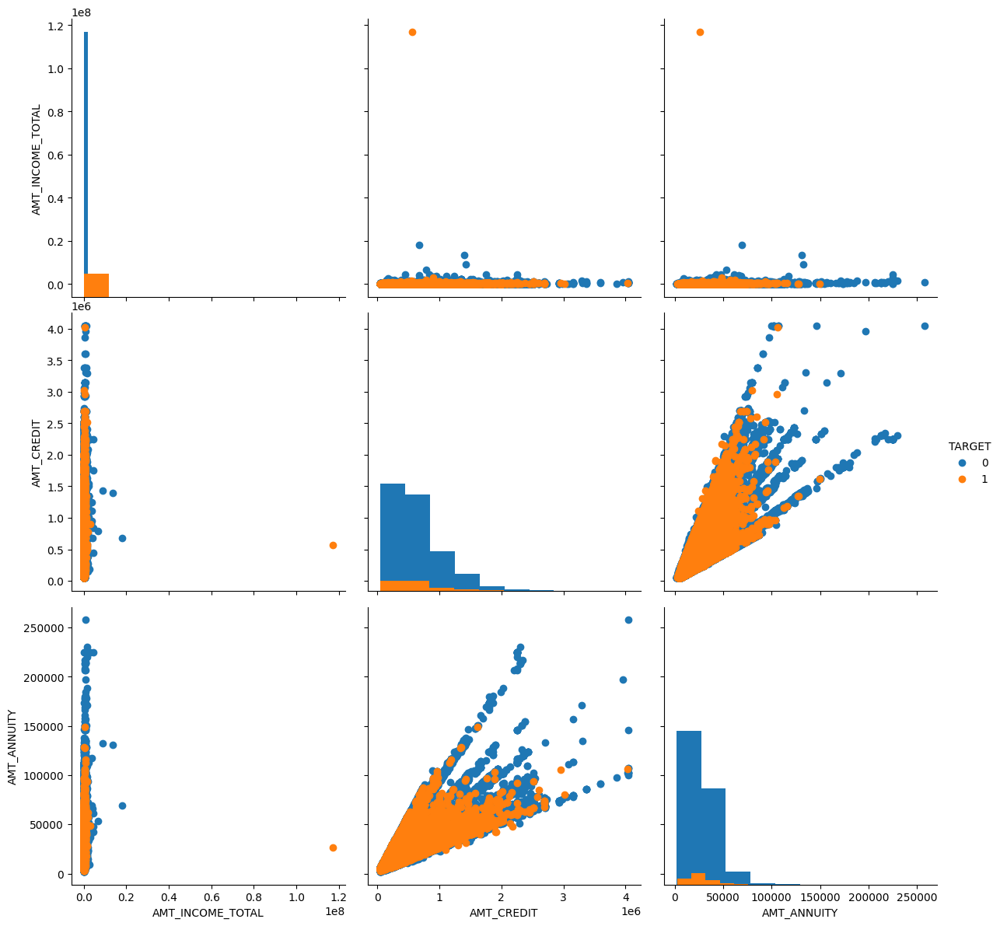

In [8]:
# Filter hanya data train yang memiliki nilai target
train_data = application_train[application_train['TARGET'].notnull()]

# Membuat sub-dataframe dengan kolom yang ingin divisualisasikan
sub_df = train_data[['TARGET', 'NAME_CONTRACT_TYPE', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY']]

# Menggunakan PairGrid untuk membuat multiple plots
grid = sns.PairGrid(sub_df, hue='TARGET', height=4)

# Membuat scatter plot untuk melihat hubungan antara variabel numerik
grid.map_offdiag(plt.scatter)

# Membuat histogram untuk melihat distribusi variabel numerik
grid.map_diag(plt.hist)

# Menambahkan legenda
grid.add_legend()

# Menampilkan plot
plt.show()


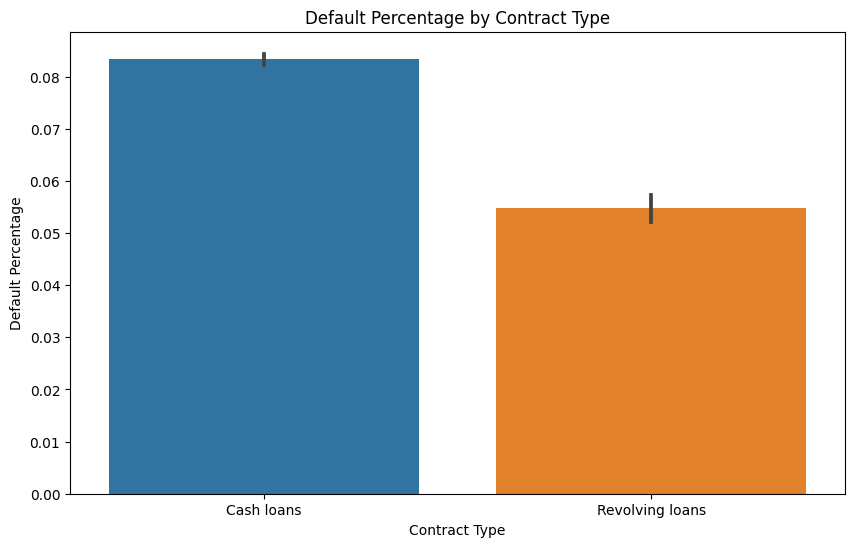

In [9]:
# Filter hanya data train yang memiliki nilai target
train_data = application_train[application_train['TARGET'].notnull()]

# Membuat barplot untuk variabel "NAME_CONTRACT_TYPE" dan "TARGET"
plt.figure(figsize=(10, 6))
sns.barplot(x="NAME_CONTRACT_TYPE", y="TARGET", data=train_data)
plt.xlabel("Contract Type")
plt.ylabel("Default Percentage")
plt.title("Default Percentage by Contract Type")
plt.show()


Jika dalam visualisasi barplot jumlah pengajuan kredit dengan jenis "Cash loans" lebih tinggi daripada jumlah pengajuan dengan jenis "Revolving loans", artinya ada lebih banyak pelamar yang mengajukan kredit dengan jenis "Cash loans" daripada jenis "Revolving loans".

Secara umum, "Cash loans" adalah jenis kontrak kredit yang umum, di mana jumlah kredit yang diminta oleh pelamar dibayarkan secara tunai dan diangsur secara berkala dalam jangka waktu tertentu. Sedangkan "Revolving loans" adalah jenis kontrak kredit yang memberikan fleksibilitas kepada pelamar untuk melakukan penarikan kembali (withdrawal) dan pembayaran kembali (repayment) dalam batas kredit yang telah ditentukan.

Dengan adanya informasi ini, Mengamati preferensi pelamar terhadap jenis kontrak kredit yang ditawarkan dan mengidentifikasi tren atau pola dalam pengajuan kredit di dataset tersebut.

#### Melihat Distribution Credit TYpes dari dataset Bureu

In [10]:
# Menghitung jumlah kredit sebelumnya
total_previous_credits = bureau['AMT_CREDIT_SUM'].count()
print("Total Previous Credits:", total_previous_credits)

# Menghitung jumlah hari keterlambatan pembayaran rata-rata
average_days_overdue = bureau['CREDIT_DAY_OVERDUE'].mean()
print("Average Days Overdue:", average_days_overdue)

# Melihat jenis-jenis kredit yang pernah dimiliki oleh pelamar
credit_types = bureau['CREDIT_TYPE'].unique()
print("Credit Types:", credit_types)

Total Previous Credits: 1716415
Average Days Overdue: 0.8181665645165425
Credit Types: ['Consumer credit' 'Credit card' 'Mortgage' 'Car loan' 'Microloan'
 'Loan for working capital replenishment' 'Loan for business development'
 'Real estate loan' 'Unknown type of loan' 'Another type of loan'
 'Cash loan (non-earmarked)' 'Loan for the purchase of equipment'
 'Mobile operator loan' 'Interbank credit'
 'Loan for purchase of shares (margin lending)']


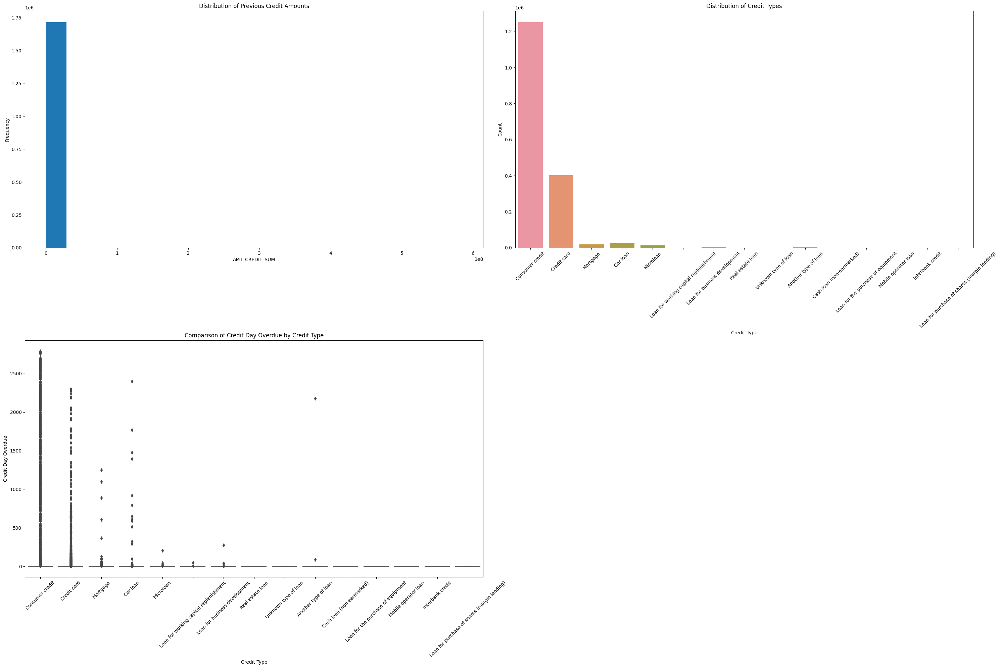

In [11]:
# Create a figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(30, 20))

# Plot 1: Histogram of AMT_CREDIT_SUM
axes[0, 0].hist(bureau['AMT_CREDIT_SUM'], bins=20)
axes[0, 0].set_xlabel('AMT_CREDIT_SUM')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Distribution of Previous Credit Amounts')

# Plot 2: Bar plot of CREDIT_TYPE
sns.countplot(x='CREDIT_TYPE', data=bureau, ax=axes[0, 1])
axes[0, 1].set_xlabel('Credit Type')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Distribution of Credit Types')
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot 3: Box plot of CREDIT_DAY_OVERDUE by CREDIT_TYPE
sns.boxplot(x='CREDIT_TYPE', y='CREDIT_DAY_OVERDUE', data=bureau, ax=axes[1, 0])
axes[1, 0].set_xlabel('Credit Type')
axes[1, 0].set_ylabel('Credit Day Overdue')
axes[1, 0].set_title('Comparison of Credit Day Overdue by Credit Type')
axes[1, 0].tick_params(axis='x', rotation=45)

# Remove empty subplot
fig.delaxes(axes[1, 1])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


* Sebagian besar pelamar tidak memiliki riwayat kredit sebelumnya yang dilaporkan (banyak nilai 0 pada kolom "AMT_CREDIT_SUM").
* Mayoritas penggunaan jenis kredit adalah "Customer credits".
* Pada jenis kredit "Consumer credit", terdapat beberapa nilai yang tinggi di atas 2500 untuk jumlah hari keterlambatan pembayaran (potensi risiko keterlambatan pembayaran).

### Insight:

* Mayoritas pelamar baru atau memiliki sejarah kredit yang terbatas.
* Mayoritas pelamar menggunakan kredit yang diberikan oleh lembaga keuangan kepada pelanggannya sendiri.
* Pelamar dengan jenis kredit "Consumer credit" memiliki risiko keterlambatan pembayaran yang perlu diperhatikan.

#### Melihat status pembayaran Berau Balance

In [12]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [13]:
# Menghitung frekuensi status pembayaran
payment_status_counts = bureau_balance['STATUS'].value_counts()
print(payment_status_counts)

STATUS
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: count, dtype: int64


C:\Users\User\AppData\Local\Temp\ipykernel_10288\1269853170.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


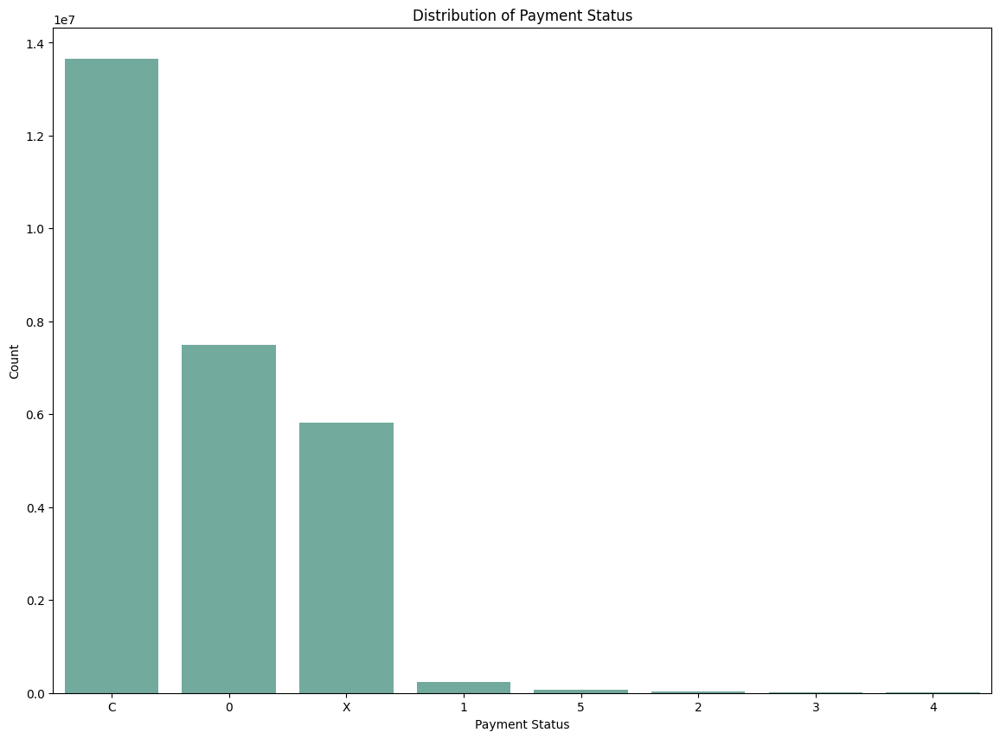

In [14]:
plt.figure(figsize=(14, 10))

# Reorder the data frame
payment_status_counts = payment_status_counts.sort_values(ascending=False)

# Make a barplot
sns.barplot(
    x=payment_status_counts.index,
    y=payment_status_counts.values,
    estimator=sum,
    ci=None,
    color='#69b3a2'
)

# Set labels and title
plt.xlabel('Payment Status')
plt.ylabel('Count')
plt.title('Distribution of Payment Status')

# Show the plot
plt.show()


* "C" (Closed): Kredit telah ditutup atau lunas.
* "0" (No DPD - Dilinquency): Tidak ada keterlambatan pembayaran (tidak ada tunggakan).
* "X" (Unknown): Status pembayaran tidak diketahui atau tidak relevan.
* "1" (1-30 DPD - Days Past Due): Ada keterlambatan pembayaran selama 1-30 hari.
* "5" (61-90 DPD): Ada keterlambatan pembayaran selama 61-90 hari.
* "2" (31-60 DPD): Ada keterlambatan pembayaran selama 31-60 hari.
* "3" (91-120 DPD): Ada keterlambatan pembayaran selama 91-120 hari.
* "4" (120+ DPD): Ada keterlambatan pembayaran lebih dari 120 hari.

Jumlah yang tercantum di sebelah status tersebut adalah frekuensi kemunculan status tersebut dalam dataset. Misalnya, "C" muncul sebanyak 13.646.993 kali, "0" muncul sebanyak 7.499.507 kali, dan seterusnya.

Jika status "C" (Closed) memiliki frekuensi kemunculan yang paling banyak, artinya sebagian besar kredit yang dilaporkan ke Biro Kredit dalam dataset "bureau_balance" telah ditutup atau lunas. Ini mengindikasikan bahwa pelamar telah berhasil melunasi kredit mereka dalam periode yang dilaporkan.

Hal ini bisa dianggap sebagai indikasi positif dalam analisis keuangan, karena menunjukkan bahwa pelamar memiliki riwayat pembayaran yang baik dan mampu melunasi kredit yang dimiliki.

#### Melihat pola keterlambatan pembayaran

In [15]:
pos_cash_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


NAME_CONTRACT_STATUS
Active                   9151119
Completed                 744883
Signed                     87260
Demand                      7065
Returned to the store       5461
Approved                    4917
Amortized debt               636
Canceled                      15
XNA                            2
Name: count, dtype: int64


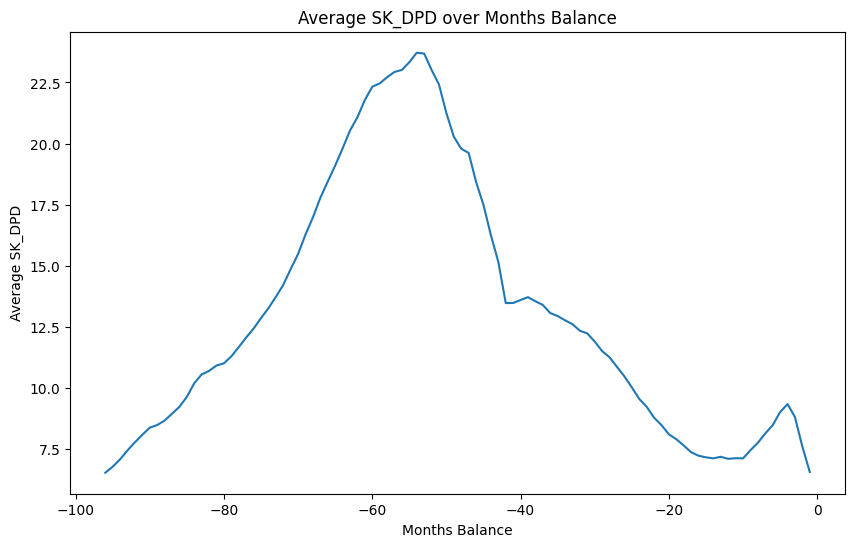

In [16]:
# Menghitung frekuensi status kontrak
contract_status_counts = pos_cash_balance['NAME_CONTRACT_STATUS'].value_counts()
print(contract_status_counts)

# Visualisasi pola keterlambatan pembayaran
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
pos_cash_balance.groupby('MONTHS_BALANCE')['SK_DPD'].mean().plot()
plt.xlabel('Months Balance')
plt.ylabel('Average SK_DPD')
plt.title('Average SK_DPD over Months Balance')
plt.show()


* Active: Menunjukkan kontrak yang sedang aktif atau berlangsung.
* Completed: Menunjukkan kontrak yang telah selesai atau selesai secara normal.
* Signed: Menunjukkan kontrak yang telah ditandatangani tetapi belum aktif.
* Demand: Menunjukkan kontrak yang ada tuntutan atau permintaan khusus.
* Returned to the store: Menunjukkan kontrak yang telah dikembalikan ke toko atau sumbernya.
* Approved: Menunjukkan kontrak yang telah disetujui untuk dilanjutkan.
* Amortized debt: Menunjukkan kontrak yang memiliki hutang yang diamortisasi atau dibayar secara berkala.
* Canceled: Menunjukkan kontrak yang telah dibatalkan atau tidak berlaku lagi.
* XNA: Menunjukkan kontrak dengan status yang tidak diketahui atau tidak berlaku

Dalam konteks saldo bulanan, nilai -60 menunjukkan 60 bulan sebelumnya dari saldo bulan terakhir dalam dataset. Jadi, ini mengindikasikan bahwa pada 60 bulan sebelumnya, keterlambatan pembayaran mencapai tingkat tertinggi atau paling parah.

In [17]:
# Menghitung jumlah bulan berturut-turut dengan keterlambatan pembayaran
consecutive_delay_count = 0
max_consecutive_delay_count = 0

for status in pos_cash_balance['NAME_CONTRACT_STATUS']:
    if status == 'Active':  # Menggunakan 'Active' sebagai status kontrak yang sedang berjalan
        consecutive_delay_count += 1
        max_consecutive_delay_count = max(max_consecutive_delay_count, consecutive_delay_count)
    else:
        consecutive_delay_count = 0

print("Max Consecutive Delay Count:", max_consecutive_delay_count)


Max Consecutive Delay Count: 773


#### Melihat pola pengeluaran kartu kredit

MONTHS_BALANCE
-96    63434.466623
-95    63763.446413
-94    64443.613043
-93    65817.713607
-92    66583.989138
           ...     
-5     68243.328503
-4     69346.773210
-3     72694.587274
-2     79662.762037
-1     95196.702958
Name: AMT_BALANCE, Length: 96, dtype: float64


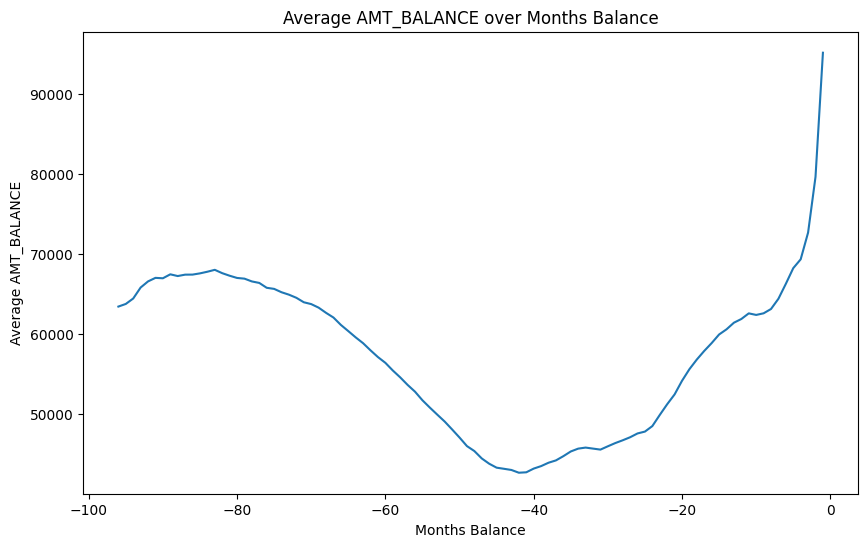

In [18]:
# Menghitung rata-rata saldo bulanan
average_balance = credit_card_balance.groupby('MONTHS_BALANCE')['AMT_BALANCE'].mean()
print(average_balance)

# Visualisasi pola pengeluaran kartu kredit
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
average_balance.plot()
plt.xlabel('Months Balance')
plt.ylabel('Average AMT_BALANCE')
plt.title('Average AMT_BALANCE over Months Balance')
plt.show()


Dalam plot tersebut, terjadi perubahan dari penurunan keterlambatan pembayaran menjadi perbaikan pada bulan 0. Ini menunjukkan bahwa pembayaran menjadi lebih baik atau lebih lancar pada bulan tersebut dibandingkan dengan periode sebelumnya.

Dengan kata lain, dari garis terendah pada nilai -40, keterlambatan pembayaran mengalami peningkatan atau perbaikan saat mencapai bulan 0. Hal ini bisa diartikan sebagai tanda positif bahwa ada kemajuan dalam pembayaran tepat waktu atau peningkatan stabilitas keuangan pada periode terkini.

Perubahan ini menunjukkan adanya perbaikan dalam manajemen pembayaran atau kinerja keuangan secara keseluruhan, yang dapat dianggap sebagai hal yang positif dalam analisis data.

#### Menghitung jumlah kolom persetujuan dan penolakaan

In [19]:
# Menghitung persentase persetujuan atau penolakan berdasarkan jenis kontrak
contract_status_percentages = previous_application.groupby('NAME_CONTRACT_TYPE')['NAME_CONTRACT_STATUS'].value_counts(normalize=True) * 100
print(contract_status_percentages)

# Menghitung persentase persetujuan atau penolakan berdasarkan alasan penolakan
reject_reason_percentages = previous_application.groupby('CODE_REJECT_REASON')['NAME_CONTRACT_STATUS'].value_counts(normalize=True) * 100
reject_reason_percentages.head()


NAME_CONTRACT_TYPE  NAME_CONTRACT_STATUS
Cash loans          Approved                41.808407
                    Canceled                35.929359
                    Refused                 22.196152
                    Unused offer             0.066082
Consumer loans      Approved                85.917732
                    Refused                 10.311307
                    Unused offer             3.557151
                    Canceled                 0.213810
Revolving loans     Approved                50.615539
                    Refused                 25.643495
                    Canceled                23.738378
                    Unused offer             0.002588
XNA                 Canceled                91.040462
                    Refused                  8.959538
Name: proportion, dtype: float64


CODE_REJECT_REASON  NAME_CONTRACT_STATUS
CLIENT              Unused offer            100.0
HC                  Refused                 100.0
LIMIT               Refused                 100.0
SCO                 Refused                 100.0
SCOFR               Refused                 100.0
Name: proportion, dtype: float64

<Figure size 1000x600 with 0 Axes>

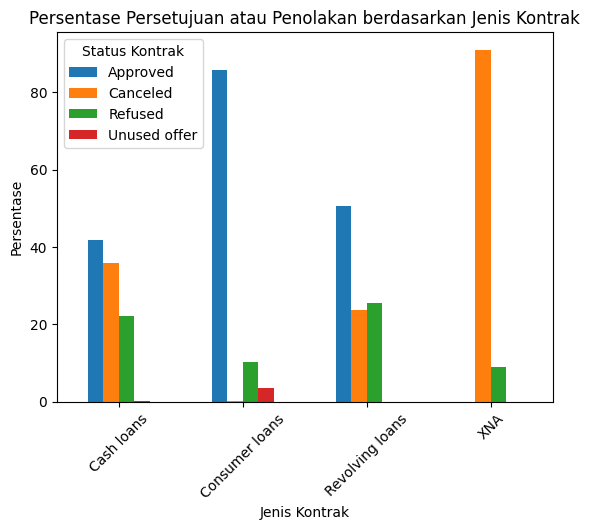

<Figure size 1000x600 with 0 Axes>

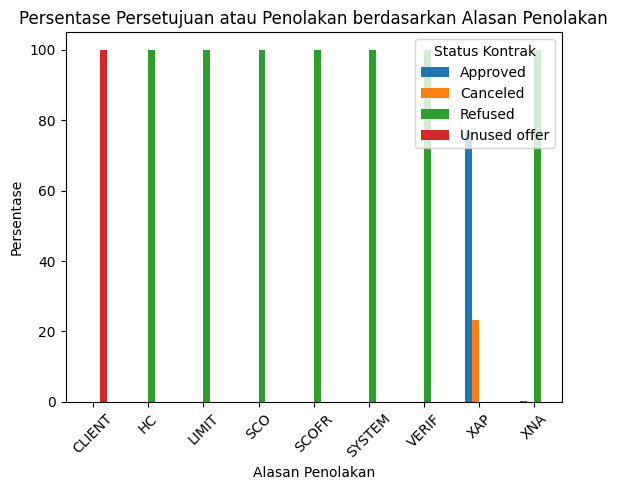

In [20]:
import matplotlib.pyplot as plt

# Menghitung persentase persetujuan atau penolakan berdasarkan jenis kontrak
contract_status_percentages = previous_application.groupby('NAME_CONTRACT_TYPE')['NAME_CONTRACT_STATUS'].value_counts(normalize=True) * 100

# Plot persentase persetujuan atau penolakan berdasarkan jenis kontrak
plt.figure(figsize=(10, 6))
contract_status_percentages.unstack().plot(kind='bar')
plt.xlabel('Jenis Kontrak')
plt.ylabel('Persentase')
plt.title('Persentase Persetujuan atau Penolakan berdasarkan Jenis Kontrak')
plt.legend(title='Status Kontrak')
plt.xticks(rotation=45)
plt.show()


# Menghitung persentase persetujuan atau penolakan berdasarkan alasan penolakan
reject_reason_percentages = previous_application.groupby('CODE_REJECT_REASON')['NAME_CONTRACT_STATUS'].value_counts(normalize=True) * 100

# Plot persentase persetujuan atau penolakan berdasarkan alasan penolakan
plt.figure(figsize=(10, 6))
reject_reason_percentages.unstack().plot(kind='bar')
plt.xlabel('Alasan Penolakan')
plt.ylabel('Persentase')
plt.title('Persentase Persetujuan atau Penolakan berdasarkan Alasan Penolakan')
plt.legend(title='Status Kontrak')
plt.xticks(rotation=45)
plt.show()


#### Beberapa insight yang dapat diperoleh dari hasil tersebut adalah:

* Jenis kontrak "Consumer loans" memiliki persentase persetujuan yang tinggi (85.92%), sementara persentase penolakan relatif rendah (10.31%) dan pembatalan juga rendah (0.21%). Hal ini menunjukkan bahwa jenis kontrak ini cenderung mendapatkan persetujuan yang tinggi.

* Jenis kontrak "Revolving loans" memiliki persentase persetujuan sekitar 50.62%, yang berarti ada sekitar setengah dari kontrak jenis ini yang mendapatkan persetujuan. Persentase penolakan (25.64%) dan pembatalan (23.74%) hampir seimbang, menunjukkan tingkat penolakan dan pembatalan yang signifikan pada jenis kontrak ini.

* Jenis kontrak "Cash loans" memiliki persentase persetujuan (41.81%) yang lebih rendah dibandingkan dengan jenis kontrak lainnya, sedangkan persentase penolakan (22.20%) dan pembatalan (35.93%) relatif tinggi. Hal ini menunjukkan bahwa jenis kontrak ini cenderung memiliki tingkat persetujuan yang lebih rendah dan tingkat penolakan serta pembatalan yang lebih tinggi.

* Jenis kontrak "XNA" memiliki pola yang unik, dengan 91.04% dari kontrak tersebut dibatalkan. Persentase penolakan (8.96%) juga terjadi pada jenis kontrak ini.

* Alasan penolakan "CLIENT", "HC", "LIMIT", "SCO", dan "SCOFR" semuanya memiliki persentase penolakan 100.00%. Ini menunjukkan bahwa jika aplikasi dikategorikan dengan alasan penolakan ini, maka persetujuan tidak diberikan pada semua kasus tersebut.

## EDA train

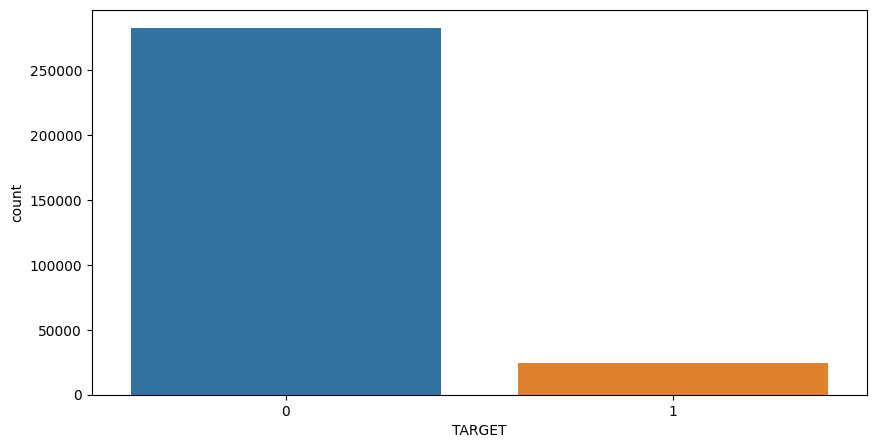

In [21]:
fig, ax = plt.subplots(figsize=(10,5))  
sns.countplot(x=application_train.TARGET)  
plt.show()  

Dari tabel visualisasi di atas cendrung nilai dengan target 0 lebih banyak daripada yang memilki nilai 1, dapat disimpulkan Dengan demikian, jika pada visualisasi data lebih banyak pengamatan dengan nilai 'TARGET' 0 daripada nilai 1, itu berarti sebagian besar pelamar dalam dataset memiliki pembayaran kredit yang baik atau tidak mengalami pembayaran tunggakan. Hal ini dapat memberikan gambaran awal bahwa mayoritas pelamar cenderung memiliki keandalan dalam membayar kredit.

* Univariate Analysis

1. Categorical Variabel

In [22]:
# extract the categorical variables
cat_var = [ feature for feature in application_train.columns if application_train[feature].dtypes=='O']
print('List of categorical variables {}'.format(cat_var))

List of categorical variables ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']


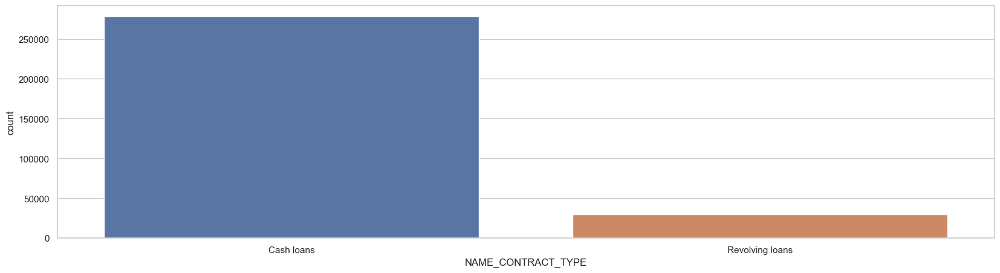

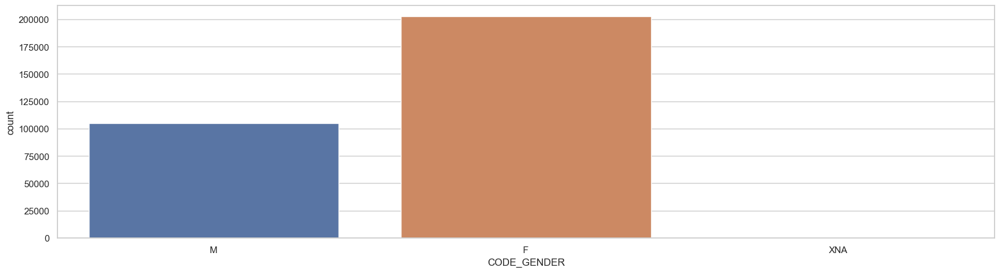

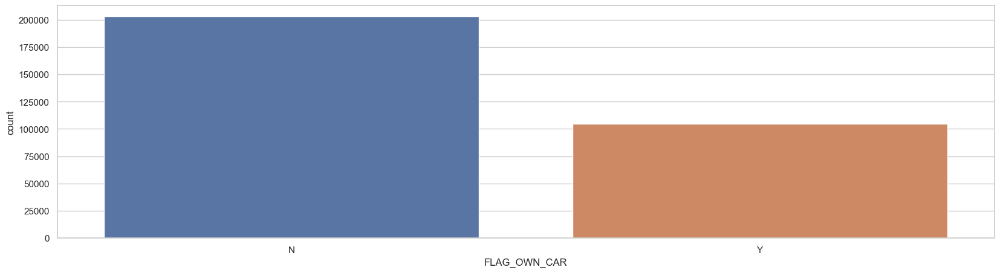

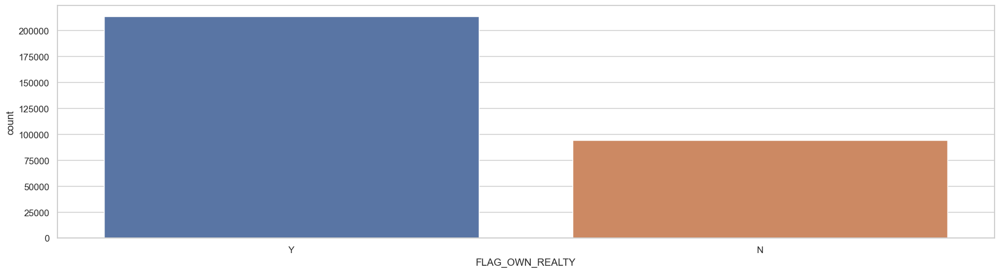

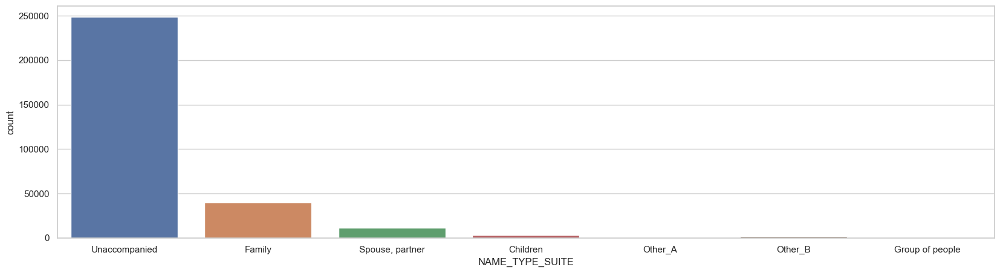

...

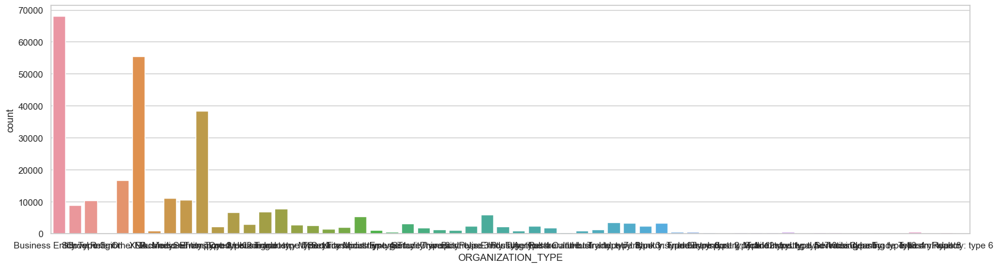

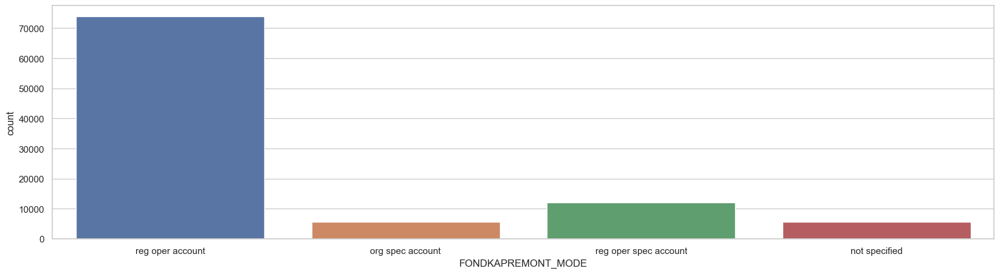

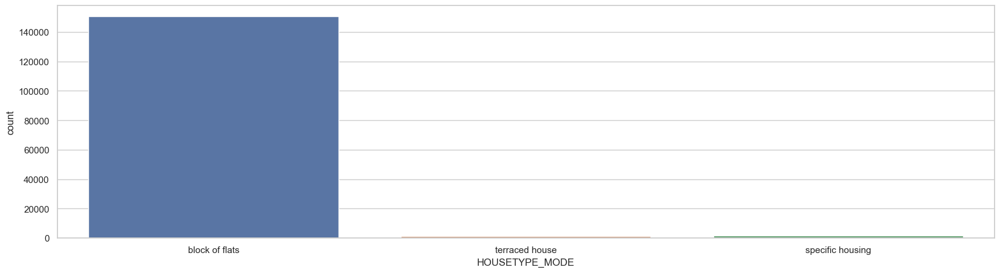

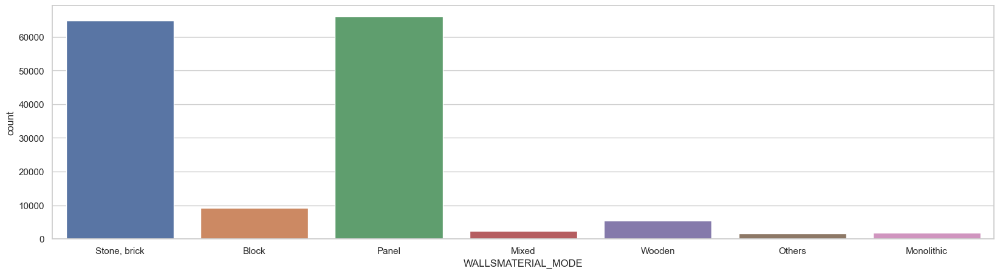

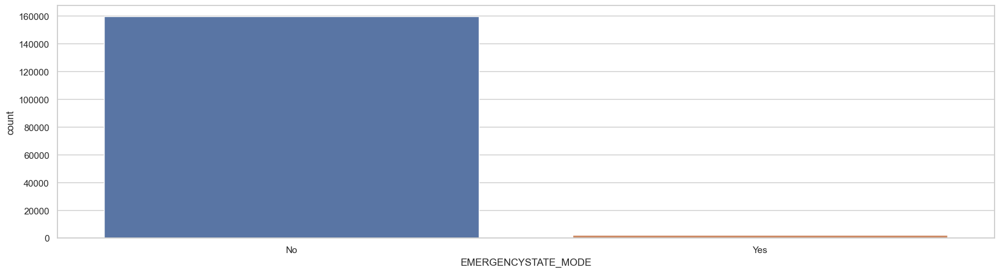

In [23]:
#display the all the categorical variable 
for feature in cat_var:
    sns.set(style = 'whitegrid')
    plt.figure(figsize=(20,5))
    total = len(application_train)
    ax = sns.countplot(x = application_train[feature], data = application_train)
    #plt.title(feature)
    (total, ax)
    plt.show()

2. Numerical Variabel

In [24]:
#Extract the numerical features from the dataset
num_var = [feature for feature in application_train.columns if application_train[feature].dtypes != 'O']
print('List of Numerical featues {}'.format(num_var))

List of Numerical featues ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGI

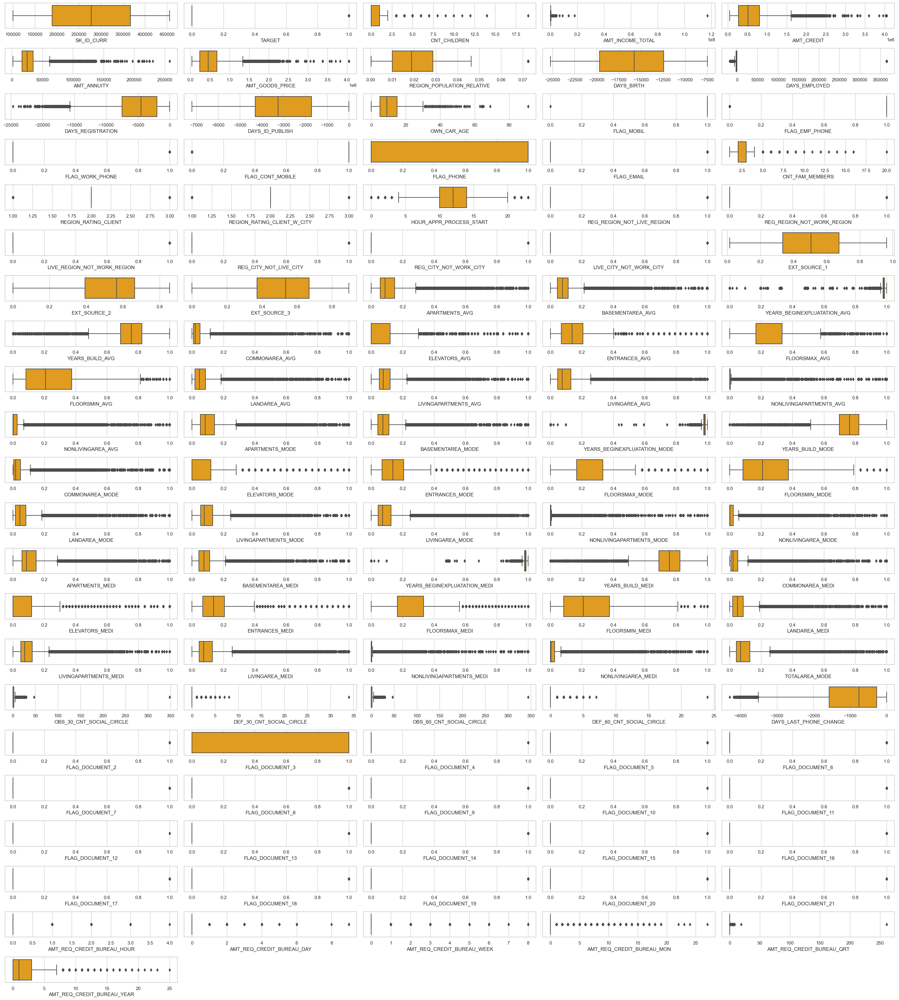

In [25]:
plt.figure(figsize=(30, 60))

for i in range(0, len(num_var)):
    plt.subplot(40, 5, i+1)
    sns.boxplot(x=application_train[num_var[i]], color='orange', orient='h')
    plt.tight_layout()

plt.show()


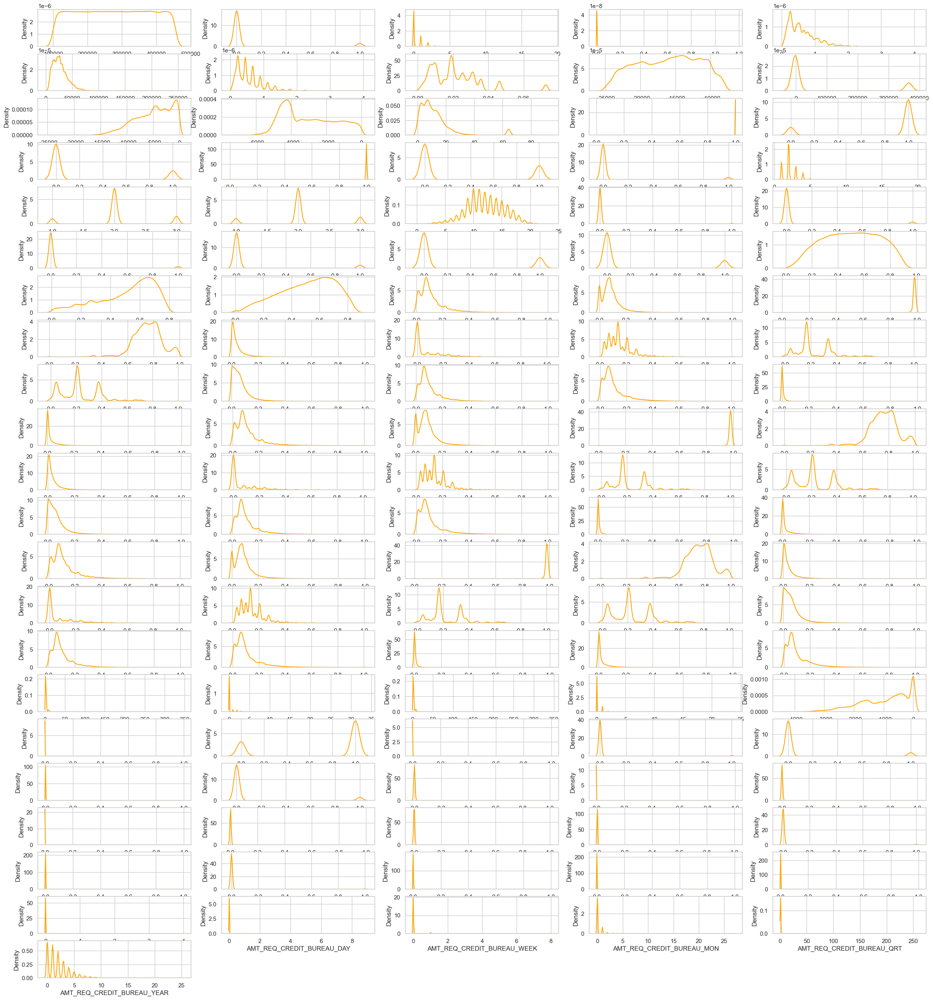

In [26]:
plt.figure(figsize=(30,60))
for i in range(len(num_var)):
    plt.subplot(40, 5, i+1)
    sns.kdeplot(x=application_train[num_var[i]], color='orange')

## Data Preprocessing

In [27]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


#### Cek Duplikat data

In [28]:
# Memeriksa duplikat data dalam dataset train
duplicate_rows = application_train.duplicated()

# Menghitung jumlah duplikat data dalam dataset train
num_duplicates = duplicate_rows.sum()

num_duplicates



0

In [29]:
# Mendeteksi dan menghitung jumlah nilai yang hilang dalam setiap kolom
application_train.isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

In [30]:
application_train.info(100)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

Mengubah categorical menjadi numerikal

In [31]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
categorical_cols = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                    'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
                    'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']

for col in categorical_cols:
    application_train[col] = le.fit_transform(application_train[col])

In [32]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,1,0,1,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,0,0,0,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,1,1,1,1,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,0,0,1,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,1,0,1,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


* heatmap

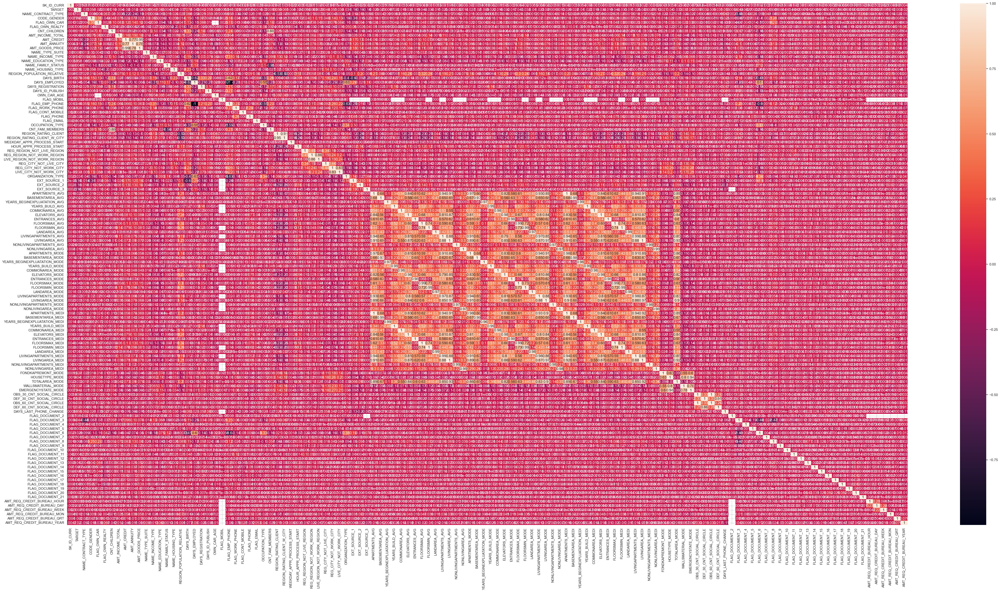

In [33]:
plt.subplots(figsize=(60,30))
sns.heatmap(application_train.corr(), annot=True)
plt.show()

* Drop after EDA - Insights

In [34]:
columns_to_drop = [
    # unique values
    'SK_ID_CURR',
    
    # all null values
    'FLAG_OWN_CAR', 'NAME_TYPE_SUITE', 'REGION_POPULATION_RELATIVE', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
    'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
    
    # Region Client
    'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
    'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
    
    # Buildings client
    'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
    'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
    'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE',
    'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
    'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI',
    'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI',
    'FONDKAPREMONT_MODE', 'TOTALAREA_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE',
    
    # Social Sircle client
    'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
    
    # Req. credit Client
    'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
    'AMT_REQ_CREDIT_BUREAU_YEAR',
    
    # Flag Dokumen
    'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3','FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
    'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
    'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']
    
   

In [35]:
df_train = application_train.drop(columns_to_drop, axis=1)
df_train.shape

(307511, 29)

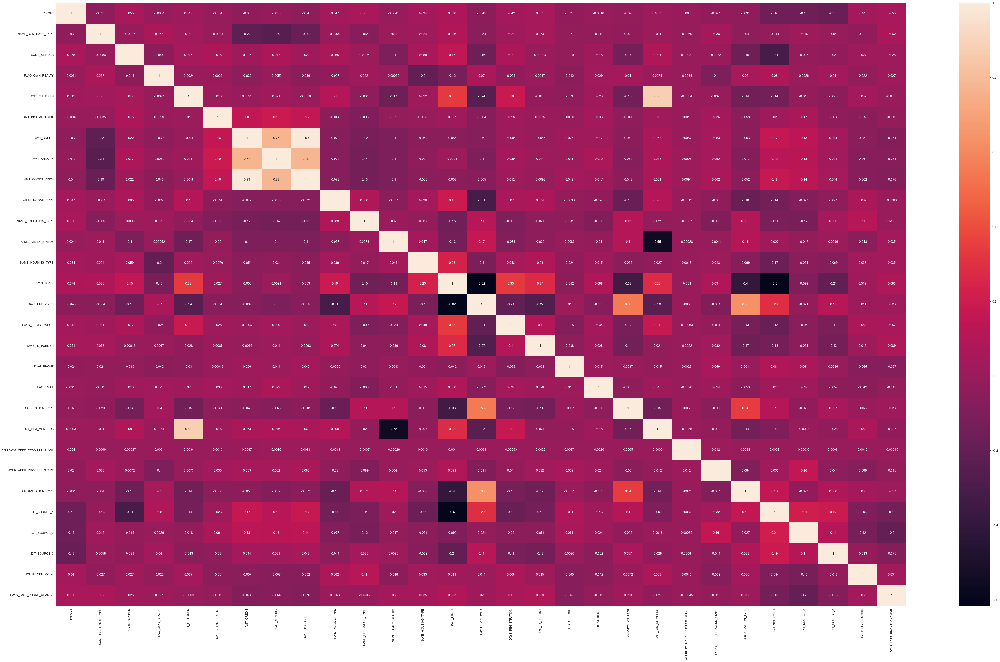

In [36]:
plt.subplots(figsize=(70,40))
sns.heatmap(df_train.corr(), annot=True)
plt.show()

* Numerical Features (Drop High Correlation)

In [37]:
# Compute the absolute correlation matrix
corr_matrix = np.abs(df_train.corr())

# Select upper triangle of the correlation matrix
mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
upper_triangle = corr_matrix.where(mask)

# Find columns with correlation greater than 0.7
to_drop_hicorr = [col for col in upper_triangle.columns if any (upper_triangle[col].gt(0.7))]
to_drop_hicorr

['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS']

In [38]:
df_train.drop(to_drop_hicorr, axis=1, inplace=True)
df_train.shape

(307511, 26)

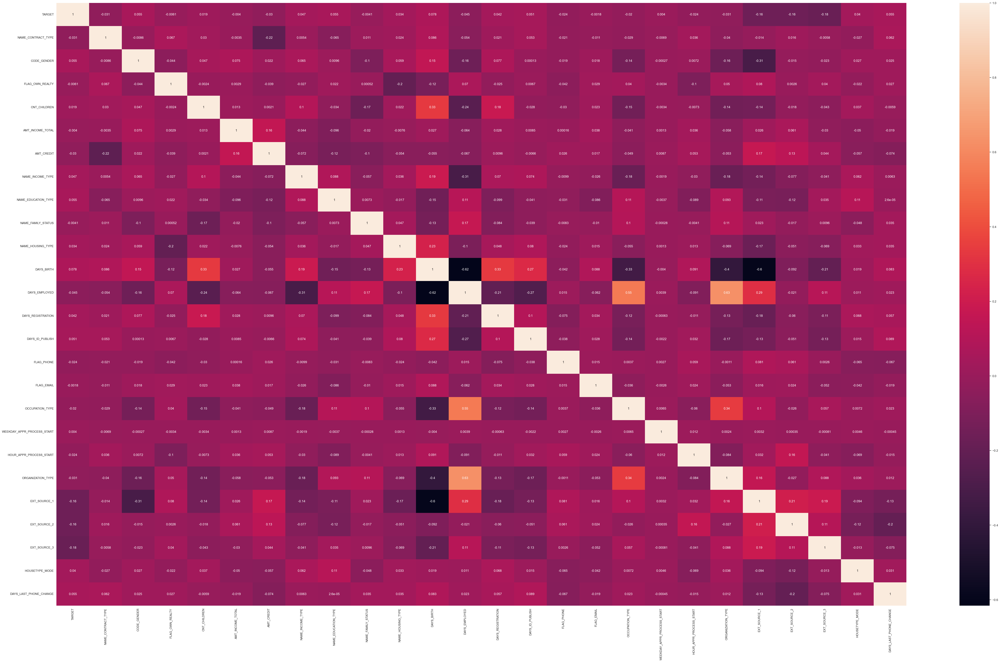

In [39]:
plt.subplots(figsize=(70,40))
sns.heatmap(df_train.corr(), annot=True)
plt.show()

* Categorical Features (Drop High Cradinality)

In [40]:
df_train.select_dtypes(include='object').nunique().sort_values(ascending=False)

Series([], dtype: float64)

In [41]:
df_train.isnull().sum()

TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_PHONE                         0
FLAG_EMAIL                         0
OCCUPATION_TYPE                    0
WEEKDAY_APPR_PROCESS_START         0
HOUR_APPR_PROCESS_START            0
ORGANIZATION_TYPE                  0
EXT_SOURCE_1                  173378
EXT_SOURCE_2                     660
EXT_SOURCE_3                   60965
HOUSETYPE_MODE                     0
DAYS_LAST_PHONE_CHANGE             1
dtype: int64

In [42]:
# Menghapus baris dengan nilai null
df_train.dropna(inplace=True)

In [43]:
df_train.isnull().sum()

TARGET                        0
NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_REALTY               0
CNT_CHILDREN                  0
AMT_INCOME_TOTAL              0
AMT_CREDIT                    0
NAME_INCOME_TYPE              0
NAME_EDUCATION_TYPE           0
NAME_FAMILY_STATUS            0
NAME_HOUSING_TYPE             0
DAYS_BIRTH                    0
DAYS_EMPLOYED                 0
DAYS_REGISTRATION             0
DAYS_ID_PUBLISH               0
FLAG_PHONE                    0
FLAG_EMAIL                    0
OCCUPATION_TYPE               0
WEEKDAY_APPR_PROCESS_START    0
HOUR_APPR_PROCESS_START       0
ORGANIZATION_TYPE             0
EXT_SOURCE_1                  0
EXT_SOURCE_2                  0
EXT_SOURCE_3                  0
HOUSETYPE_MODE                0
DAYS_LAST_PHONE_CHANGE        0
dtype: int64

#### Define Target

In [44]:
# Menghitung frekuensi nilai unik dalam sebuah kolom
df_train['TARGET'].value_counts()

TARGET
0    101591
1      7998
Name: count, dtype: int64

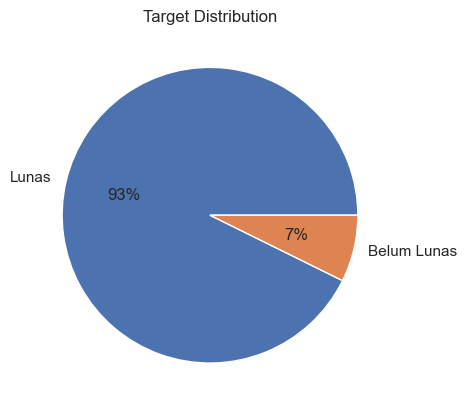

In [45]:
plt.pie(df_train['TARGET'].value_counts().values, labels=['Lunas', 'Belum Lunas'], autopct='%.0f%%')
plt.title('Target Distribution')
plt.show()

# Machine Learning Modelling

In [46]:
from sklearn.model_selection import train_test_split

X = df_train.drop(['TARGET'], axis=1)
y = df_train['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [47]:
X_train.shape

(87671, 25)

In [48]:
y_train.shape

(87671,)

In [49]:
X_test.shape

(21918, 25)

In [50]:
y_test.shape

(21918,)

In [51]:
y_test.value_counts()

TARGET
0    20330
1     1588
Name: count, dtype: int64

#### Undersampling

In [52]:
# before undersampling
print(pd.Series(y_train).value_counts())


TARGET
0    81261
1     6410
Name: count, dtype: int64


In [53]:
# after undersampling
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=69)
X_undersampling, y_undersampling = rus.fit_resample(X_train, y_train)

print(pd.Series(y_undersampling).value_counts())

TARGET
0    6410
1    6410
Name: count, dtype: int64


In [54]:
X_undersampling.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12820 entries, 0 to 12819
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   NAME_CONTRACT_TYPE          12820 non-null  int32  
 1   CODE_GENDER                 12820 non-null  int32  
 2   FLAG_OWN_REALTY             12820 non-null  int32  
 3   CNT_CHILDREN                12820 non-null  int64  
 4   AMT_INCOME_TOTAL            12820 non-null  float64
 5   AMT_CREDIT                  12820 non-null  float64
 6   NAME_INCOME_TYPE            12820 non-null  int32  
 7   NAME_EDUCATION_TYPE         12820 non-null  int32  
 8   NAME_FAMILY_STATUS          12820 non-null  int32  
 9   NAME_HOUSING_TYPE           12820 non-null  int32  
 10  DAYS_BIRTH                  12820 non-null  int64  
 11  DAYS_EMPLOYED               12820 non-null  int64  
 12  DAYS_REGISTRATION           12820 non-null  float64
 13  DAYS_ID_PUBLISH             128

In [55]:
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, precision_score, f1_score, confusion_matrix

def evaluate_model(model):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_undersampling)
    y_pred_proba = model.predict_proba(X_test)
    y_pred_proba_train = model.predict_proba(X_undersampling)
    
    print('**EVALUATION WITH UNDERSAMPLING**\nAUC Train vs Test:')
    print(f'AUC Score Train proba: {round(roc_auc_score(y_undersampling,y_pred_proba_train[:,1]),6)}')
    print(f'AUC Score Test proba: {round(roc_auc_score(y_test,y_pred_proba[:,1]),6)}\n')
    
    print('Others Metrics Evaluation:')
    print(f'Test Accuracy Score : {round(accuracy_score(y_test,y_pred),4)}')
    print(f'Precision Score Test: {round(precision_score(y_test,y_pred),4)}')
    print(f'Recall Score Test : {round(recall_score(y_test,y_pred),4)}')
    print(f'F1 Score Test : {round(f1_score(y_test,y_pred),4)}\n')
    
    print('**CONFUSION MATRIX**') 
    print(confusion_matrix(y_test, y_pred))

In [56]:
from sklearn.linear_model import LogisticRegression
model_lr = LogisticRegression()
model_lr.fit(X_undersampling, y_undersampling)

LogisticRegression()

In [57]:
evaluate_model(model_lr)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.555422
AUC Score Test proba: 0.535692

Others Metrics Evaluation:
Test Accuracy Score : 0.599
Precision Score Test: 0.0792
Recall Score Test : 0.427
F1 Score Test : 0.1336

**CONFUSION MATRIX**
[[12450  7880]
 [  910   678]]


In [58]:
from sklearn.tree import DecisionTreeClassifier
model_dtree = DecisionTreeClassifier(random_state=69)
model_dtree.fit(X_undersampling, y_undersampling)

DecisionTreeClassifier(random_state=69)

In [59]:
evaluate_model(model_dtree)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 1.0
AUC Score Test proba: 0.593427

Others Metrics Evaluation:
Test Accuracy Score : 0.5882
Precision Score Test: 0.1019
Recall Score Test : 0.5995
F1 Score Test : 0.1742

**CONFUSION MATRIX**
[[11941  8389]
 [  636   952]]


In [60]:
from sklearn.ensemble import RandomForestClassifier
model_rforest = RandomForestClassifier(random_state=69)
model_rforest.fit(X_undersampling, y_undersampling)

RandomForestClassifier(random_state=69)

In [61]:
evaluate_model(model_rforest)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 1.0
AUC Score Test proba: 0.737158

Others Metrics Evaluation:
Test Accuracy Score : 0.696
Precision Score Test: 0.146
Recall Score Test : 0.6587
F1 Score Test : 0.239

**CONFUSION MATRIX**
[[14210  6120]
 [  542  1046]]


In [62]:
from sklearn.ensemble import AdaBoostClassifier
model_adaboost = AdaBoostClassifier(random_state=69)
model_adaboost.fit(X_undersampling, y_undersampling)

AdaBoostClassifier(random_state=69)

In [63]:
evaluate_model(model_adaboost)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.763075
AUC Score Test proba: 0.7443

Others Metrics Evaluation:
Test Accuracy Score : 0.6928
Precision Score Test: 0.1453
Recall Score Test : 0.6637
F1 Score Test : 0.2384

**CONFUSION MATRIX**
[[14130  6200]
 [  534  1054]]


In [64]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


In [65]:
from xgboost import XGBClassifier

model_xgboost = XGBClassifier(random_state=69)
model_xgboost.fit(X_undersampling, y_undersampling)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=69, ...)

In [66]:
evaluate_model(model_xgboost)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.970425
AUC Score Test proba: 0.728006

Others Metrics Evaluation:
Test Accuracy Score : 0.6721
Precision Score Test: 0.1377
Recall Score Test : 0.67
F1 Score Test : 0.2284

**CONFUSION MATRIX**
[[13666  6664]
 [  524  1064]]


In [67]:
pip install lightgbm


Note: you may need to restart the kernel to use updated packages.


In [68]:
from lightgbm import LGBMClassifier

model_lgbm = LGBMClassifier(random_state=69)
model_lgbm.fit(X_undersampling, y_undersampling)

LGBMClassifier(random_state=69)

In [69]:
evaluate_model(model_lgbm)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.892217
AUC Score Test proba: 0.746024

Others Metrics Evaluation:
Test Accuracy Score : 0.6896
Precision Score Test: 0.1464
Recall Score Test : 0.6801
F1 Score Test : 0.241

**CONFUSION MATRIX**
[[14035  6295]
 [  508  1080]]


### Hyperparameter Tuning

In [70]:
def evaluation_tuned(model):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_undersampling)
    y_pred_proba = model.predict_proba(X_test)
    y_pred_proba_train = model.predict_proba(X_undersampling)
    
    print('**EVALUATION WITH UNDERSAMPLING**\nAUC Train vs Test:')
    print(f'AUC Score Train proba: {round(roc_auc_score(y_undersampling,y_pred_proba_train[:,1]),6)}')
    print(f'AUC Score Test proba: {round(roc_auc_score(y_test,y_pred_proba[:,1]),6)}\n')
    
    print('Others Metrics Evaluation:')
    print(f'Test Accuracy Score : {round(accuracy_score(y_test,y_pred),4)}')
    print(f'Precision Score Test: {round(precision_score(y_test,y_pred),4)}')
    print(f'Recall Score Test : {round(recall_score(y_test,y_pred),4)}')
    print(f'F1 Score Test : {round(f1_score(y_test,y_pred),4)}\n')
    
    print('**CONFUSION MATRIX**') 
    print(confusion_matrix(y_test, y_pred))

In [71]:
from sklearn.model_selection import RandomizedSearchCV

In [72]:
logreg = LogisticRegression()
logreg_hyparameters = {"penalty": ['l1', 'l2'],
                       "C":[float(x) for x in np.linspace(0.001, 10, 100)]}

tuned_logreg = RandomizedSearchCV(logreg, logreg_hyparameters, cv = 5, random_state=69, n_jobs=-1, scoring='recall')
tuned_logreg.fit(X_undersampling, y_undersampling)

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
40 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'C': [0.001, 0.10200000000000001, 0.203,
                                              0.30400000000000005, 0.405, 0.506,
                                              0.6070000000000001,
                                              0.7080000000000001, 0.809, 0.91,
                                              1.011, 1.1119999999999999, 1.213,
                                              1.314, 1.415, 1.516, 1.617, 1.718,
                                              1.819, 1.92, 2.021, 2.122, 2.223,
                                              2.324, 2.4250000000000003,
                                              2.5260000000000002,
                                              2.6270000000000002, 2.728, 2.829,
                                              2.93, ...],
                                        'penalty': ['l1', 'l2']},
                   random_state=69, scoring='recall')

In [73]:
print(f'Best Parameter: {tuned_logreg.best_params_}')

Best Parameter: {'penalty': 'l2', 'C': 6.263000000000001}


In [74]:
evaluation_tuned(tuned_logreg)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.555421
AUC Score Test proba: 0.535692

Others Metrics Evaluation:
Test Accuracy Score : 0.599
Precision Score Test: 0.0792
Recall Score Test : 0.427
F1 Score Test : 0.1337

**CONFUSION MATRIX**
[[12451  7879]
 [  910   678]]


In [75]:
dtree = DecisionTreeClassifier()
dtree_hyparameters = {"criterion":['gini','entropy'],
                      "max_depth":[5,14,24],
                      "min_samples_split":[2,10,100],
                      "min_samples_leaf":[2,10,100],
                      "max_features":['auto','sqrt']}

tuned_dtree = RandomizedSearchCV(dtree, dtree_hyparameters, cv=5, random_state=69, n_jobs=-1, scoring='recall')
tuned_dtree.fit(X_undersampling, y_undersampling)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 14, 24],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [2, 10, 100],
                                        'min_samples_split': [2, 10, 100]},
                   random_state=69, scoring='recall')

In [76]:
print(f'Best Parameter: {tuned_dtree.best_params_}')

Best Parameter: {'min_samples_split': 100, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 5, 'criterion': 'entropy'}


In [77]:
evaluation_tuned(tuned_dtree)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.736402
AUC Score Test proba: 0.70161

Others Metrics Evaluation:
Test Accuracy Score : 0.7037
Precision Score Test: 0.1394
Recall Score Test : 0.597
F1 Score Test : 0.226

**CONFUSION MATRIX**
[[14475  5855]
 [  640   948]]


In [78]:
rforest = RandomForestClassifier()
rforest_hyparameters = {"n_estimators":[5,10,20,30],
                        "criterion":['gini','entropy'],
                        "max_depth":[5,10,15],
                        "min_samples_split":[5,10,20],
                        "min_samples_leaf":[5,10,20],
                        "max_features":['auto','sqrt']}

tuned_rforest = RandomizedSearchCV(rforest, rforest_hyparameters, cv = 5, random_state=69,n_jobs=-1, scoring='recall')
tuned_rforest.fit(X_undersampling, y_undersampling)

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 10, 15],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [5, 10, 20],
                                        'min_samples_split': [5, 10, 20],
                                        'n_estimators': [5, 10, 20, 30]},
                   random_state=69, scoring='recall')

In [79]:
print(f'Best Parameter: {tuned_rforest.best_params_}')

Best Parameter: {'n_estimators': 30, 'min_samples_split': 20, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 10, 'criterion': 'entropy'}


In [80]:
evaluation_tuned(tuned_rforest)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:


AUC Score Train proba: 0.867666
AUC Score Test proba: 0.73892

Others Metrics Evaluation:
Test Accuracy Score : 0.6859
Precision Score Test: 0.1435
Recall Score Test : 0.6713
F1 Score Test : 0.2364

**CONFUSION MATRIX**
[[13967  6363]
 [  522  1066]]


In [81]:
%%time
adaboost = AdaBoostClassifier()
adaboost_hyparameters = {"n_estimators": [75, 80], # best params 75
                         "learning_rate": [0.5, 0.7], # best params 0.5
                         "algorithm": ['SAMME.R']} # best params SAMME.R

tuned_adaboost = RandomizedSearchCV(adaboost, adaboost_hyparameters, cv=5, random_state=69, n_jobs=-1, scoring='recall')
tuned_adaboost.fit(X_undersampling, y_undersampling)

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


CPU times: total: 1.66 s
Wall time: 4.51 s


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'algorithm': ['SAMME.R'],
                                        'learning_rate': [0.5, 0.7],
                                        'n_estimators': [75, 80]},
                   random_state=69, scoring='recall')

In [82]:
print(f'Best Parameter: {tuned_adaboost.best_params_}')

Best Parameter: {'n_estimators': 80, 'learning_rate': 0.5, 'algorithm': 'SAMME.R'}


In [83]:
evaluation_tuned(tuned_adaboost)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.765725
AUC Score Test proba: 0.747905

Others Metrics Evaluation:
Test Accuracy Score : 0.6924
Precision Score Test: 0.1451
Recall Score Test : 0.6637
F1 Score Test : 0.2382

**CONFUSION MATRIX**
[[14121  6209]
 [  534  1054]]


In [84]:
xgboost = XGBClassifier()  # set n_estimators to 190
xgboost_hyparameters = {
    'max_depth': [3, 4], #best4
    'xgboost__tree_method' : ['auto', 'exact', 'approx', 'hist'],
    'learning_rate': [0.2], #best
    'n_estimators': [190], #best190
    'gamma': [0, 0.1], #best0
    'subsample': [0.6, 0.7], #best0.6
    'colsample_bytree': [0.7, 0.8, 0.9], #best 0.8
    'min_child_weight': [1, 2] #best3
}

tuned_xgboost = RandomizedSearchCV(xgboost, xgboost_hyparameters, cv=5, random_state=69, n_jobs=-1, scoring='recall')
eval_set = [(X_undersampling, y_undersampling), (X_test, y_test)]
tuned_xgboost.fit(X_undersampling, y_undersampling, early_stopping_rounds=10, eval_metric='auc', eval_set=eval_set)

[17:23:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "xgboost__tree_method" } are not used.

[0]	validation_0-auc:0.72340	validation_1-auc:0.70660
[1]	validation_0-auc:0.74248	validation_1-auc:0.72187
[2]	validation_0-auc:0.74296	validation_1-auc:0.72178
[3]	validation_0-auc:0.75522	validation_1-auc:0.73062
[4]	validation_0-auc:0.75718	validation_1-auc:0.73269
[5]	validation_0-auc:0.75920	validation_1-auc:0.73528
[6]	validation_0-auc:0.76138	validation_1-auc:0.73622
[7]	validation_0-auc:0.76277	validation_1-auc:0.73703
[8]	validation_0-auc:0.76555	validation_1-auc:0.73848
[9]	validation_0-auc:0.76761	validation_1-auc:0.73955
[10]	validation_0-auc:0.76921	validation_1-auc:0.73990
[11]	validation_0-auc:0.77098	validation_1-auc:0.74097
[12]	validation_0-auc:0.77248	validation_1-auc:0.74160
[13]	validation_0-auc:0.77422	validation_1-auc:0.74243
[14]	validation_0-auc:0.77625	

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[22]	validation_0-auc:0.78591	validation_1-auc:0.74600
[23]	validation_0-auc:0.78698	validation_1-auc:0.74629
[24]	validation_0-auc:0.78865	validation_1-auc:0.74706
[25]	validation_0-auc:0.78947	validation_1-auc:0.74687
[26]	validation_0-auc:0.79049	validation_1-auc:0.74699
[27]	validation_0-auc:0.79149	validation_1-auc:0.74715
[28]	validation_0-auc:0.79228	validation_1-auc:0.74702
[29]	validation_0-auc:0.79384	validation_1-auc:0.74730
[30]	validation_0-auc:0.79480	validation_1-auc:0.74698
[31]	validation_0-auc:0.79520	validation_1-auc:0.74724
[32]	validation_0-auc:0.79621	validation_1-auc:0.74696
[33]	validation_0-auc:0.79742	validation_1-auc:0.74665
[34]	validation_0-auc:0.79833	validation_1-auc:0.74641
[35]	validation_0-auc:0.79930	validation_1-auc:0.74654
[36]	validation_0-auc:0.80040	validation_1-auc:0.74642
[37]	validation_0-auc:0.80120	validation_1-auc:0.74649
[38]	validation_0-auc:0.80251	validation_1-auc:0.74670
[39]	validation_0-auc:0.80391	validation_1-auc:0.74638


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 0.9],
                                        'gamma': [0, 0.1],
                                        'learning_rate': [0.2],
                                        'max_depth': [3, 4],
                                        'min_child_weight': [1, 2],
                                        'n_estimators': [190],
                                        'subsample': [0.6, 0.7],
                                        'xgboost__tree_method': ['auto',
                                                                 'exact',
                                                                 'approx',
                                                                 'hist']},
                   random_state=69, scoring='recall')

In [85]:
print(f'Best Parameter: {tuned_xgboost.best_params_}')

Best Parameter: {'xgboost__tree_method': 'auto', 'subsample': 0.7, 'n_estimators': 190, 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.2, 'gamma': 0.1, 'colsample_bytree': 0.7}


In [86]:
evaluation_tuned(tuned_xgboost)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.793837
AUC Score Test proba: 0.747297

Others Metrics Evaluation:
Test Accuracy Score : 0.692
Precision Score Test: 0.1455
Recall Score Test : 0.6669
F1 Score Test : 0.2388

**CONFUSION MATRIX**
[[14109  6221]
 [  529  1059]]


In [87]:
lgbm = LGBMClassifier()
lgbm_hyparameters = {'max_depth': [4, 5], #
                     'min_child_samples': [20, 25], #
                     'learning_rate': [0.8, 0.9], #
                     'num_leaves': [15, 17], #
                     'subsample': [0.3, 0.4], #
                     'colsample_bytree': [0.8, 0.85],
                     'reg_alpha': [0.15, 0.19], #
                     'reg_lambda': [0.1, 0.8]} #

tuned_lgbm = RandomizedSearchCV(lgbm, lgbm_hyparameters, cv=5, random_state=69, n_jobs=-1, scoring='recall')
tuned_lgbm.fit(X_undersampling, y_undersampling)

RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.8, 0.85],
                                        'learning_rate': [0.8, 0.9],
                                        'max_depth': [4, 5],
                                        'min_child_samples': [20, 25],
                                        'num_leaves': [15, 17],
                                        'reg_alpha': [0.15, 0.19],
                                        'reg_lambda': [0.1, 0.8],
                                        'subsample': [0.3, 0.4]},
                   random_state=69, scoring='recall')

In [88]:
print(f'Best Parameter: {tuned_lgbm.best_params_}')

Best Parameter: {'subsample': 0.4, 'reg_lambda': 0.8, 'reg_alpha': 0.19, 'num_leaves': 17, 'min_child_samples': 25, 'max_depth': 4, 'learning_rate': 0.8, 'colsample_bytree': 0.85}


In [89]:
evaluation_tuned(tuned_lgbm)

**EVALUATION WITH UNDERSAMPLING**
AUC Train vs Test:
AUC Score Train proba: 0.930979
AUC Score Test proba: 0.699288

Others Metrics Evaluation:
Test Accuracy Score : 0.6429
Precision Score Test: 0.1237
Recall Score Test : 0.6461
F1 Score Test : 0.2077

**CONFUSION MATRIX**
[[13064  7266]
 [  562  1026]]


In [90]:
# confusion matrix after hyperparameter tuning
logreg_cm = confusion_matrix(y_test, tuned_logreg.predict(X_test))
dtree_cm = confusion_matrix(y_test, tuned_dtree.predict(X_test))
rforest_cm = confusion_matrix(y_test, tuned_rforest.predict(X_test))
adaboost_cm = confusion_matrix(y_test, tuned_adaboost.predict(X_test))
xgboost_cm = confusion_matrix(y_test, tuned_xgboost.predict(X_test))
lgbm_cm = confusion_matrix(y_test, tuned_lgbm.predict(X_test))

In [91]:
def dataframe_to_plot(title, classification_cm) -> pd.DataFrame:
    tn, fp, fn, tp = classification_cm.ravel()
    
    accuracy = round(((tp+tn) / (tn + tp + fn + fp)),4)
    sensitivity = round((tp / (fn + tp)),4)
    precision = round((tp / (tp + fp)),4)
    f1 = round(((2 * (1/((1/precision) + (1/sensitivity))))), 4)
    
    foo = pd.DataFrame(data=[f1, accuracy, sensitivity, precision], 
             columns=[title],
             index=["F1","Accuracy", "Recall", "Precision"])
    
    return foo

logreg_df = dataframe_to_plot('Tuned Logistic Regression', logreg_cm)
dtree_df = dataframe_to_plot('Tuned Decision Tree', dtree_cm)
rforest_df = dataframe_to_plot('Tuned Random Forest', rforest_cm)
adaboost_df = dataframe_to_plot('Tuned Adaboost', adaboost_cm)
xgboost_df = dataframe_to_plot('Tuned XGBoost', xgboost_cm)
lgbm_df = dataframe_to_plot('Tuned LGBM', lgbm_cm)

In [92]:
add_eval_logreg = pd.DataFrame(data=[round(roc_auc_score(y_undersampling,(tuned_logreg.predict_proba(X_undersampling))[:,1]),5),
                                     round(roc_auc_score(y_test,(tuned_logreg.predict_proba(X_test))[:,1]),5)],
                               columns = ['Tuned Logistic Regression'],
                               index=['AUC-Proba Train','AUC-Proba Test'])

add_eval_dtree = pd.DataFrame(data=[round(roc_auc_score(y_undersampling,(tuned_dtree.predict_proba(X_undersampling))[:,1]),5),
                                     round(roc_auc_score(y_test,(tuned_dtree.predict_proba(X_test))[:,1]),5)],
                               columns = ['Tuned Decision Tree'],
                               index=['AUC-Proba Train','AUC-Proba Test'])

add_eval_rforest = pd.DataFrame(data=[round(roc_auc_score(y_undersampling,(tuned_rforest.predict_proba(X_undersampling))[:,1]),5),
                                     round(roc_auc_score(y_test,(tuned_rforest.predict_proba(X_test))[:,1]),5)],
                               columns = ['Tuned Random Forest'],
                               index=['AUC-Proba Train','AUC-Proba Test'])

add_eval_adaboost = pd.DataFrame(data=[round(roc_auc_score(y_undersampling,(tuned_adaboost.predict_proba(X_undersampling))[:,1]),5),
                                     round(roc_auc_score(y_test,(tuned_adaboost.predict_proba(X_test))[:,1]),5)],
                               columns = ['Tuned Adaboost'],
                               index=['AUC-Proba Train','AUC-Proba Test'])


add_eval_xgboost = pd.DataFrame(data=[round(roc_auc_score(y_undersampling,(tuned_xgboost.predict_proba(X_undersampling))[:,1]),5),
                                      round(roc_auc_score(y_test,(tuned_xgboost.predict_proba(X_test))[:,1]),5)],
                                columns = ['Tuned XGBoost'],
                                index=['AUC-Proba Train','AUC-Proba Test'])

add_eval_lgbm = pd.DataFrame(data=[round(roc_auc_score(y_undersampling,(tuned_lgbm.predict_proba(X_undersampling))[:,1]),5),
                                      round(roc_auc_score(y_test,(tuned_lgbm.predict_proba(X_test))[:,1]),5)],
                                columns = ['Tuned LGBM'],
                                index=['AUC-Proba Train','AUC-Proba Test'])

In [93]:
logreg_df = pd.concat([add_eval_logreg,logreg_df])
dtree_df = pd.concat([add_eval_dtree,dtree_df])
rforest_df = pd.concat([add_eval_rforest,rforest_df])
adaboost_df = pd.concat([add_eval_adaboost,adaboost_df])
xgboost_df = pd.concat([add_eval_xgboost,xgboost_df])
lgbm_df = pd.concat([add_eval_lgbm,lgbm_df])

In [94]:
logreg_df = logreg_df.reindex(["AUC-Proba Train", "AUC-Proba Test","Recall","Precision","F1","Accuracy"])
dtree_df = dtree_df.reindex(["AUC-Proba Train", "AUC-Proba Test","Recall","Precision","F1","Accuracy"])
rforest_df = rforest_df.reindex(["AUC-Proba Train", "AUC-Proba Test","Recall","Precision","F1","Accuracy"])
adaboost_df = adaboost_df.reindex(["AUC-Proba Train", "AUC-Proba Test","Recall","Precision","F1","Accuracy"])
xgboost_df = xgboost_df.reindex(["AUC-Proba Train", "AUC-Proba Test","Recall","Precision","F1","Accuracy"])
lgbm_df = lgbm_df.reindex(["AUC-Proba Train", "AUC-Proba Test","Recall","Precision","F1","Accuracy"])

In [95]:
class Colors:
    LightGray = "#ff0000"
    Teal = "#0d5388"
    LightCyan = "#fc9f3c"

In [96]:
pip install matplotlib


Note: you may need to restart the kernel to use updated packages.


C:\Users\User\AppData\Local\Temp\ipykernel_10288\2006673586.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


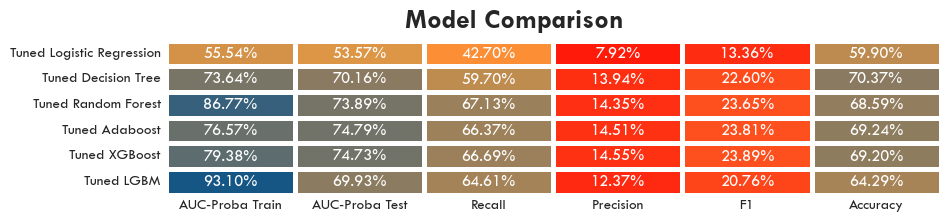

In [97]:
import matplotlib
matplotlib.rcParams['font.family'] = 'Tw Cen MT'

df_models = round(pd.concat([logreg_df, dtree_df, rforest_df, adaboost_df, xgboost_df, lgbm_df], axis=1),4)
colors = [Colors.LightGray, Colors.LightCyan, Colors.Teal]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)


fig = plt.figure(figsize=(10,8),dpi=100, facecolor='white') # create figure
gs = fig.add_gridspec(3, 3, wspace=0.1, hspace=0.5)

ax0 = fig.add_subplot(gs[0:1, :])
ax0.patch.set_facecolor('white')
sns.heatmap(df_models.T, cmap=colormap, annot=True,fmt=".2%",vmin=0,vmax=0.95, linewidths=2.5,cbar=False,ax=ax0,annot_kws={"fontsize":12})
ax0.patch.set_facecolor('white')
ax0.tick_params(axis=u'both', which=u'both',length=0)

ax0.text(1.85,-0.5,'Model Comparison',fontsize=20,fontweight='bold',fontfamily='serif', fontname='Tw Cen MT')

fig.show()

rforest Score Before Hyperparameter Tuning
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6410
           1       1.00      1.00      1.00      6410

    accuracy                           1.00     12820
   macro avg       1.00      1.00      1.00     12820
weighted avg       1.00      1.00      1.00     12820

rforest Score After Hyperparameter Tuning
              precision    recall  f1-score   support

           0       0.69      0.91      0.78      6410
           1       0.86      0.60      0.70      6410

    accuracy                           0.75     12820
   macro avg       0.78      0.75      0.74     12820
weighted avg       0.78      0.75      0.74     12820



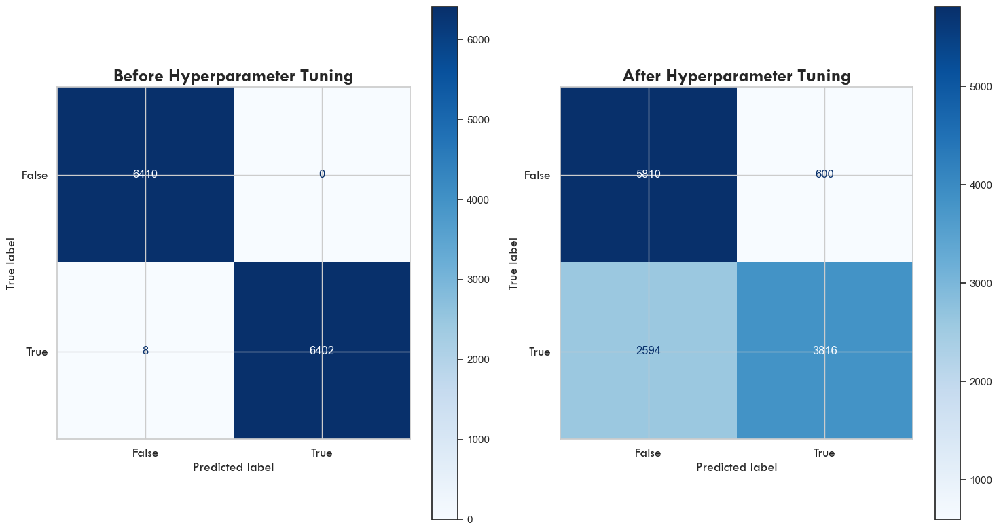

In [98]:
from sklearn import metrics

matplotlib.rcParams['font.family'] = 'Tw Cen MT'
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
sns.set_style("white")

# adjust font size of axis labels
ax[0].tick_params(labelsize=14)
ax[1].tick_params(labelsize=14)

# adjust font size of x and y axis labels
ax[0].set_xlabel("Predicted Labels", fontsize=14)
ax[0].set_ylabel("True Labels", fontsize=14)
ax[1].set_xlabel("Predicted Labels", fontsize=14)
ax[1].set_ylabel("True Labels", fontsize=14)

ax[0].set_title("Before Hyperparameter Tuning", fontsize=20, weight='bold')
ax[1].set_title("After Hyperparameter Tuning", fontsize=20, weight='bold')

# Set threshold value
threshold = 0.6

# Get predicted probabilities
y_pred_probs_before_tuning = model_rforest.predict_proba(X_undersampling)[:, 1]
y_pred_probs_after_tuning = tuned_rforest.predict_proba(X_undersampling)[:, 1]

# Apply threshold to get binary labels
y_pred_before_tuning = (y_pred_probs_before_tuning > threshold).astype(int)
y_pred_after_tuning = (y_pred_probs_after_tuning > threshold).astype(int)

print("rforest Score Before Hyperparameter Tuning")
print(metrics.classification_report(y_undersampling, y_pred_before_tuning))
metrics.ConfusionMatrixDisplay(
    confusion_matrix=metrics.confusion_matrix(y_undersampling, y_pred_before_tuning),
    display_labels=[False, True]).plot(ax=ax[0], cmap='Blues')

print("rforest Score After Hyperparameter Tuning")
print(metrics.classification_report(y_undersampling, y_pred_after_tuning))
metrics.ConfusionMatrixDisplay(
    confusion_matrix=metrics.confusion_matrix(y_undersampling, y_pred_after_tuning),
    display_labels=[False, True]).plot(ax=ax[1], cmap='Blues')
plt.tight_layout()
plt.show()

In [99]:
from sklearn.metrics import roc_curve
from scipy.stats import ks_2samp

# Before Hyperparameter Tuning
y_pred_before_tuning_proba = model_rforest.predict_proba(X_undersampling)[:,1]
fpr_, tpr_, thresholds_ = roc_curve(y_undersampling, y_pred_before_tuning_proba)

roc_auc_value_ = roc_auc_score(y_undersampling, y_pred_before_tuning_proba).round(4)
gini_value_ = ((2*roc_auc_value_)-1).round(4)
stat_KS_, p_value_ = ks_2samp(y_undersampling, y_pred_before_tuning_proba)
df_fpr_tpr_before = pd.DataFrame({'FPR':fpr_, 'TPR':tpr_, 'Threshold':thresholds_})

# After Hyperparameter Tuning
y_pred_after_tuning_proba = tuned_rforest.predict_proba(X_undersampling)[:,1]
fpr, tpr, thresholds = roc_curve(y_undersampling, y_pred_after_tuning_proba)
                                                                 
roc_auc_value = roc_auc_score(y_undersampling, y_pred_after_tuning_proba).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)
stat_KS, p_value = ks_2samp(y_undersampling, y_pred_after_tuning_proba)   
df_fpr_tpr_after = pd.DataFrame({'FPR':fpr, 'TPR':tpr, 'Threshold':thresholds})
                              
#Table
tabel_perform_model = pd.DataFrame({'Kategori (Data Test)':['Before Hyperparamater Tunning', 'After Hyperparamater Tunning'],
                             'AUC_ROC' : [roc_auc_value_, roc_auc_value],
                             'Gini' : [gini_value_, gini_value],
                            'KS' : [round(stat_KS_,4), round(stat_KS,4)]})

In [100]:
tabel_perform_model

,Kategori (Data Test),AUC_ROC,Gini,KS
0,Before Hyperparamater Tunning,1.0000,1.0000,0.4998
1,After Hyperparamater Tunning,0.8677,0.7354,0.5000


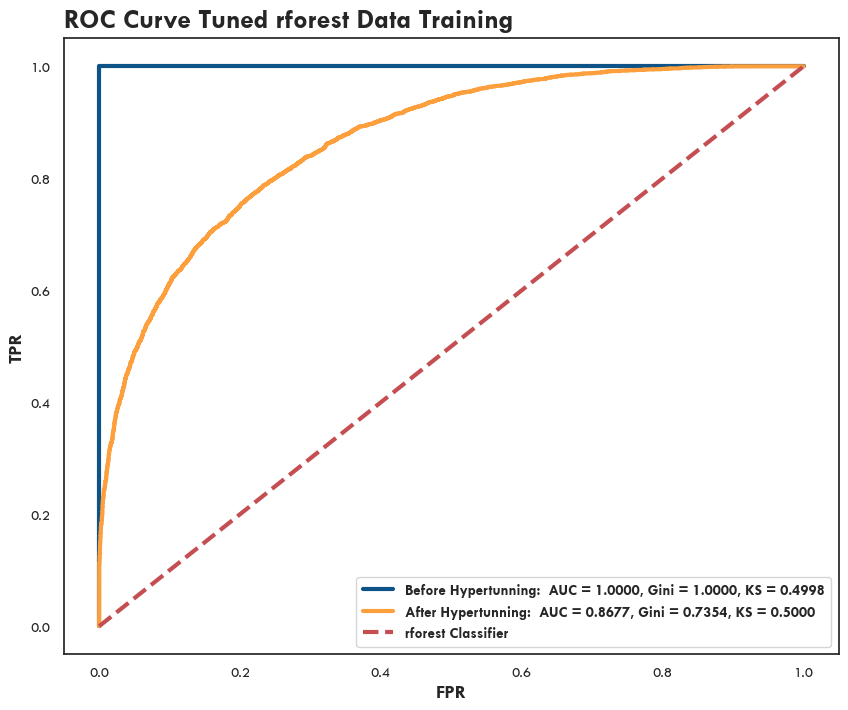

In [101]:
matplotlib.rcParams['font.family'] = 'Tw Cen MT'
fig, ax = plt.subplots(1,1,figsize=(10,8))
ax.plot()
plt.plot(fpr_, tpr_, '#0d5388', label='%s AUC = %0.4f, Gini = %0.4f, KS = %0.4f' % ('Before Hypertunning: ', tabel_perform_model['AUC_ROC'][0], tabel_perform_model['Gini'][0], tabel_perform_model['KS'][0]),linewidth=3)
plt.plot(fpr, tpr, '#fc9f3c', label='%s AUC = %0.4f, Gini = %0.4f, KS = %0.4f' % ('After Hypertunning: ', tabel_perform_model['AUC_ROC'][1], tabel_perform_model['Gini'][1], tabel_perform_model['KS'][1]),linewidth=3)
plt.plot([0,1], [0,1], 'r--', label='rforest Classifier', linewidth=3)
plt.text(x=-0.05,y=1.07,s="ROC Curve Tuned rforest Data Training",fontsize=20,weight='bold')
plt.xlabel('FPR',weight='bold',fontsize=14)
plt.ylabel('TPR',weight='bold',fontsize=14)
legend_properties = {'weight':'bold'}
plt.legend(prop=legend_properties)
plt.show()

rforest Score After Hyperparameter Tuning on Test Set
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     20330
           1       0.14      0.67      0.24      1588

    accuracy                           0.69     21918
   macro avg       0.55      0.68      0.52     21918
weighted avg       0.90      0.69      0.76     21918



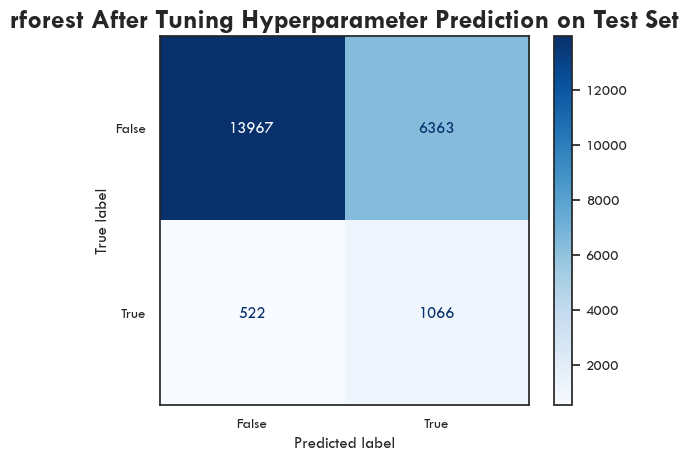

In [102]:
matplotlib.rcParams['font.family'] = 'Tw Cen MT'

y_pred_test_tuned = tuned_rforest.predict(X_test)
y_pred_test_tuned_proba = tuned_rforest.predict_proba(X_test)[:,1]

print("rforest Score After Hyperparameter Tuning on Test Set")
print(metrics.classification_report(y_test,y_pred_test_tuned))
confusion_matrix = metrics.confusion_matrix(y_test, y_pred_test_tuned)
metrics.ConfusionMatrixDisplay(
    confusion_matrix = confusion_matrix, 
    display_labels = [False, True]).plot(cmap='Blues')
plt.title("rforest After Tuning Hyperparameter Prediction on Test Set", fontsize=20, fontweight='bold');

C:\Users\User\AppData\Local\Temp\ipykernel_10288\3438150079.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


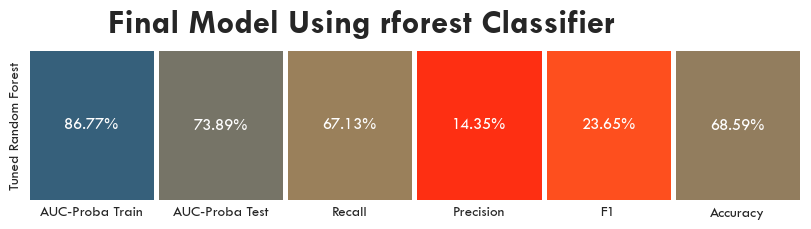

In [103]:
matplotlib.rcParams['font.family'] = 'Tw Cen MT'
df_models = round(pd.concat([rforest_df], axis=1),4)
colors = [Colors.LightGray, Colors.LightCyan, Colors.Teal]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)


fig = plt.figure(figsize=(10,8),dpi=100, facecolor='white') # create figure
gs = fig.add_gridspec(3, 2, wspace=0.1, hspace=0.5)

ax0 = fig.add_subplot(gs[0:1, :])
ax0.patch.set_facecolor('white')
sns.heatmap(df_models.T, cmap=colormap, annot=True,fmt=".2%",vmin=0,vmax=0.95, linewidths=2.5,cbar=False,ax=ax0,annot_kws={"fontsize":12})
ax0.patch.set_facecolor('white')
ax0.tick_params(axis=u'both', which=u'both',length=0)

ax0.text(0.625,-0.1,'Final Model Using rforest Classifier',fontsize=25,fontweight='bold',fontfamily='serif', fontname='Tw Cen MT')

fig.show()

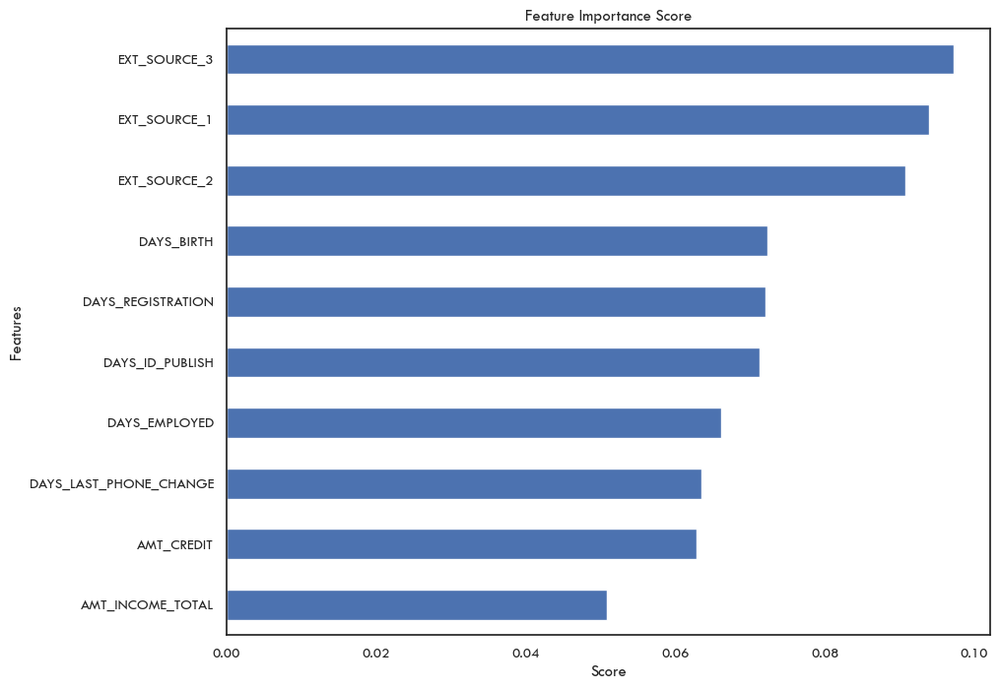

In [104]:
def show_feature_importance(model, X):
    importances = model.feature_importances_
    feat_importances = pd.Series(importances, index=X.columns)
    ax = feat_importances.nlargest(10).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()
    plt.xlabel('Score')
    plt.ylabel('Features')
    plt.title('Feature Importance Score')
    plt.show()

# Assuming tuned_rforest is your trained RandomForestClassifier model
tuned_rforest = RandomForestClassifier()
tuned_rforest.fit(X, y)  # X and y represent your training data

show_feature_importance(tuned_rforest, X)

# Business Acumen